In [1]:
import openbabel
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import ast
import seaborn as sns
import openbabel.pybel as pybel
import glob
import itertools
from IPython.display import SVG

# From scPDB to a training set

We will use scPDB dataset which contains on download, 17594 PDB directories. Some of them are repeated, probably because have more than 1 binding site (around 982, which I have stored in a list). From these we have therefore 16612 unique PDB identifiers. 

We map them to a UniprotID KD and we obtain 5643 UniProt IDs. These will serve us to first clusterize strucutres that refer to the same protein. This simplifies the later training even if we lose a bit of information about different binding modes that the protein can have. 

It will be important in the future to look at the complete clusters and check if there are different binding sites. We need to account them.

We will first then obtain these clusters and look at how many strucutres where in each one.

## Clustering according to UniProt ID

In [2]:
%%bash

! for i in ../db/scPDB/*; do echo ${i:12:4} >> PDB_list; done
! sort PDB_list | uniq  > PDB_list_cleansed
! sort PDB_list > PDB_list_sorted
! comm -23 PDB_list_sorted PDB_list_cleansed > PDB_repeated

CalledProcessError: Command 'b'\n! for i in ../db/scPDB/*; do echo ${i:12:4} >> PDB_list; done\n! sort PDB_list | uniq  > PDB_list_cleansed\n! sort PDB_list > PDB_list_sorted\n! comm -23 PDB_list_sorted PDB_list_cleansed > PDB_repeated\n'' returned non-zero exit status 1.

I have a script uniprot_maping.py that I use to retrieve the Uniprot IDs from Uniprot.

In [ ]:
%%bash 

! sed -e 's/;/\",\"/g; s/^\([^\"]*\)\",\"\(.*\),\"$/\1;\[\"\2\];/g' PDB_uniprot_maping_orig.csv > PDB_uniprot_maping.csv


Now we have a .csv with a nice disposition of the clusters.
(i had to do the previous sed command because I'm stupid and I generated a format with a lot of columns that would not be readable. I did not want to retrieve again all the UniProt codes so I just do a bit of formating in old reliable sed.

In [2]:
PDB_maping_df = pd.read_csv('PDB_uniprot_maping.csv', sep=';', names=['UniProtID', 'PDB_codes'], index_col=False)

In [3]:
PDB_maping_df

,UniProtID,PDB_codes
0,P05102,"[""10mh"",""1fjx"",""1mht"",""1skm"",""2c7q"",""2hmy"",""2i..."
1,P00669,"[""11bg""]"
2,P09211,"[""12gs"",""13gs"",""17gs"",""19gs"",""1aqv"",""1aqx"",""1g..."
3,P26446,"[""1a26"",""1efy"",""1pax""]"
4,P14061,"[""1a27"",""1dht"",""1equ"",""1fds"",""1fdt"",""1fdu"",""1f..."
...,...,...
5638,P23528,"[""5l6w""]"
5639,Q8JJ25,"[""5l8j"",""5l8k"",""5l8l""]"
5640,Q7YW97,"[""5lc1""]"
5641,P21554,"[""5tgz"",""5xr8"",""5xra""]"


We have 5643 UniProtID KD (clusters)

In [4]:
PDB_maping_df['PDB_codes'][0]

'["10mh","1fjx","1mht","1skm","2c7q","2hmy","2i9k","2uyh","2z6u","2zcj","3mht","4mht","5mht","7mht","8mht","9mht"]'

In [5]:
PDB_maping_df['PDB_codes'] =PDB_maping_df['PDB_codes'].apply(lambda x: ast.literal_eval(x))

In [6]:
type(PDB_maping_df['PDB_codes'][0])

list

In [7]:
PDB_maping_df['len'] = PDB_maping_df['PDB_codes'].apply(lambda x: len(x))

In [8]:
PDB_maping_df['len_int'] = pd.cut(PDB_maping_df['len'], bins=[0,1,2,3,5,7,10,20,99,300], labels=['1','2','3','4-5','6-7','8-10','11-20','21-99','100-300'])



<Axes: xlabel='len_int', ylabel='Count'>

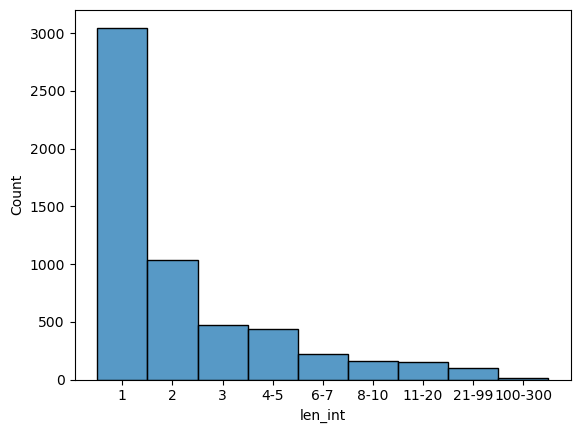

In [10]:
sns.histplot(PDB_maping_df['len_int'], stat='count')

So, the majority of clusters have just 1 protein. For the others, we will have to decide which one to use. We will calculate the tanimoto coefficient. Later, we will have to compare clusters betwen them, because 3000 strucutres is too much for our model.

In [6]:
subset_big_df = PDB_maping_df.loc[PDB_maping_df['len_int'] != '1']

In [12]:
subset_big_df

,UniProtID,PDB_codes,len,len_int
0,P05102,"[10mh, 1fjx, 1mht, 1skm, 2c7q, 2hmy, 2i9k, 2uy...",16,11-20
2,P09211,"[12gs, 13gs, 17gs, 19gs, 1aqv, 1aqx, 1gss, 1pg...",22,21-99
3,P26446,"[1a26, 1efy, 1pax]",3,3
4,P14061,"[1a27, 1dht, 1equ, 1fds, 1fdt, 1fdu, 1fdw, 1i5...",17,11-20
5,P62157,"[1a29, 1lin, 1qiv, 1qiw, 1xa5]",5,4-5
...,...,...,...,...
5618,Q9LBJ0,"[5jdz, 5je2, 5je3, 5je4]",4,4-5
5625,P59078,"[5k0s, 5k0t]",2,2
5629,Q97ML2,"[5kf1, 5kf2, 5kf8, 5kf9, 5kgh, 5kgj, 5kgp]",7,6-7
5639,Q8JJ25,"[5l8j, 5l8k, 5l8l]",3,3


## Calculating tanimoto coefficients

So, in the paper what they do is to take the entire protein and take with a sliding widnow each 3 residues, use them to compute their MACCS key and append it to a list. then, this entire array is what they compare between proteins taking the intersection and denominator to get the tanimoto coefficient.

I can try this but first let's see what happens if I just directly calculate the MACCS for the entire protein.

In [13]:
#example
'../db/scPDB/1a26_1/protein.mol2'

'../db/scPDB/1a26_1/protein.mol2'

In [14]:
prot1 = next(pybel.readfile('mol2', '../db/scPDB/1a26_1/protein.mol2'))

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a26_CNA_1_protein)



In [18]:
prot_fp = prot1.calcfp('MACCS')

In [19]:
maccs = list(prot_fp.bits)

In [20]:
len(maccs)

86

In [9]:
subset_test = PDB_maping_df.loc[PDB_maping_df['len'] == 4]

In [10]:
list_test = subset_test['PDB_codes'].iloc[1]

In [24]:
fp_dict = {}
for i in list_test:
    for folder in glob.glob('../db/scPDB/'+i+'*/'):
        protein = next(pybel.readfile('mol2', folder+'protein.mol2'))
        prot_fp = protein.calcfp('MACCS')
        if i in fp_dict:
            fp_dict[i].append(prot_fp)
        else:
            fp_dict[i] = [prot_fp]

        
    

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a8r_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a9c_GTP_10_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3r_GTP_12_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3s_GTP_9_protein)



In [25]:
fp_dict

{'1a8r': [<openbabel.pybel.Fingerprint at 0x7f2a4ffed650>],
 '1a9c': [<openbabel.pybel.Fingerprint at 0x7f2a4fe25310>],
 '1n3r': [<openbabel.pybel.Fingerprint at 0x7f2a4fef56d0>],
 '1n3s': [<openbabel.pybel.Fingerprint at 0x7f2a4fc1e290>]}

In [137]:
for i in itertools.combinations(fp_dict, 2):
    print(fp_dict[i[0]][0] | fp_dict[i[1]][0])

1.0
1.0
1.0
1.0
1.0
1.0


So, those are the Tanimoto coefficient for these PDBs. Now, just as a demonstration I will compare this with an unrelated protein

In [149]:
for folder in glob.glob('../db/scPDB/12gs*'):
    protein_2 = next(pybel.readfile('mol2', folder+'/protein.mol2'))
    protein_2_fp = protein_2.calcfp('MACCS')

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 12gs_0HH_1_protein)



In [150]:
fp_dict['1a8r'][0] | protein_2_fp

1.0

Therefore, we are seeing why we need to calculate several fingerprints for proteins, a string of 87 numbers is not enough to distinguish proteins.

First, I have to learn how to generate these "sliding windows" as a coherent molecules... not just their atoms but I need the entire residues and connected.

In [7]:
def get_sliding_windows(protein_path, file_type):
    mol = next(pybel.readfile(file_type, protein_path))
    residues = [x for x in openbabel.OBResidueIter(mol.OBMol)]
    for i in range(len(residues)-3):
        window = residues[i:i+3]
        window_res = openbabel.OBMol()
        for r in window:
            for atom in openbabel.OBResidueAtomIter(r):
                window_res.AddAtom(atom)
        window_res.ConnectTheDots()
        mol = pybel.Molecule(window_res)
        return mol
    

In [16]:
molec = get_sliding_windows('../db/scPDB/1a26_1/protein.mol2', 'mol2')

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a26_CNA_1_protein)



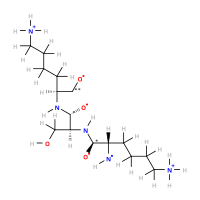

In [21]:
SVG(molec.write("svg"))

(Note: you are not seing here the output of last cell for some reason, it poped out to another window...)

This looks decent. Now, we need to continue the development of this function to calculate really the fingerprints. In the paper of PureResNet they calculatye a 167-bits key. This means that we should calculate the MACCS fingerprint, obtain the bits and transform this into 1 or 0 in a list of 167 digits.

If the MACCS was: 22, 67, 45... then we will put a 1 in the 22, 67 and 45 digit and 0 in the others.

Then to calculate the tanimoto coefficient...

$T = N_{A&B} / N_{A} + N_{B} – N_{A&B}$

Where N_{A&B} is the features common (intersection)


In [8]:
def calculate_fingerprints(protein_path, file_type):
    fingerprint_l = []
    mol = next(pybel.readfile(file_type, protein_path))
    residues = [x for x in openbabel.OBResidueIter(mol.OBMol)]
    for i in range(len(residues)-3):
        window = residues[i:i+3]
        window_res = openbabel.OBMol()
        for r in window:
            for atom in openbabel.OBResidueAtomIter(r):
                window_res.AddAtom(atom)
        window_res.ConnectTheDots()
        mol = pybel.Molecule(window_res)
        maccs_key = list(mol.calcfp('MACCS').bits)
        fingerprint = [1 if bit in maccs_key else 0 for bit in range(167)]
        fingerprint_l.append(fingerprint)
        return fingerprint_l

In [9]:
def calculate_tanimoto_coef(fingerprint1, fingerprint2):
    fp1_a = np.asarray(fingerprint1)
    fp2_a = np.asarray(fingerprint2)
    intersect = np.sum(fp1_a*fp2_a)
    tanimoto = intersect / (np.sum(fp1_a)+np.sum(fp2_a)-intersect)
    return tanimoto

Now, in the paper they explain that in each cluster, they calculate the 167-bit array and:

if A1 = A2 -> Tanimoto is calculated.

A1 > A2 or A2 > A1: This should not happen... we are letting the array have a 167 length. but if it happens in the paper what they do is take the length of the shortest and create all possible arrays of the longest one, calculate all the tanimotos and take the maximum value.

In [10]:
def get_tanimoto(filetype1, file1, filetype2, file2):
    finger1 = calculate_fingerprints(file1, filetype1)
    finger2 = calculate_fingerprints(file2, filetype2)
    if len(finger1) == len(finger2):
        tanimoto = calculate_tanimoto_coef(finger1, finger2)
        return tanimoto
    else:
        #this shouldn't be happening
        print("MACCS have different length")
        l_1 = len(finger1)
        l_2 = len(finger2)
        if l_1 > l_2:
            tanimotos_l = []
            for i in range(l_1-l_2):
                tani = calculate_tanimoto_coef(finger1[i:i+l_2], finger2)
                tanimotos_l.append(tani)
            return np.max(tanimotos_l)
        else:
            tanimotos_l = []
            for i in range(l_2-l_1):
                tani = calculate_tanimoto_coef(finger1, finger2[i:i+l_1])
                tanimotos_l.append(tani)
            return np.max(tanimotos_l)


In [38]:
folder1 = glob.glob('../db/scPDB/1n3r*/')[0]
folder2 = glob.glob('../db/scPDB/2xhx*/')[0]
tanimoto = get_tanimoto('mol2', folder1+'protein.mol2', 
                                    'mol2', folder2+'protein.mol2')
tanimoto

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3r_GTP_12_protein)



0.7

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xhx_T5M_1_protein)



(this was just to show what happens when we put two very dissimilar proteins... they get a lower coefficient). 
Believe me, they are pretty different.
At the same time this is showing us that we should use a threshold above 0.7... this is why we will use 0.8 also because it is what in Pureresnet paper was used.

In [30]:
list_test

['1a8r', '1a9c', '1n3r', '1n3s']

In [34]:
tanimotos_l = []

for i,j in itertools.combinations(list_test, 2):
    temp_tan = []
    for folder1 in glob.glob('../db/scPDB/'+i+'*/'):
        for folder2 in glob.glob('../db/scPDB/'+j+'*/'):
            tanimoto = get_tanimoto('mol2', folder1+'protein.mol2', 
                                    'mol2', folder2+'protein.mol2')
            temp_tan.append(tanimoto)
    tanimotos_l.append((i, j, np.max(temp_tan)))

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a8r_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a9c_GTP_10_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a8r_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3r_GTP_12_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a8r_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3s_GTP_9_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a9c_GTP_10_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n3r_GTP_12_protein)

*** Open Babel Warning  in ReadMolec

In [42]:
pd.DataFrame(tanimotos_l)

,0,1,2
0,1a8r,1a9c,1.0
1,1a8r,1n3r,1.0
2,1a8r,1n3s,1.0
3,1a9c,1n3r,1.0
4,1a9c,1n3s,1.0
5,1n3r,1n3s,1.0


Now, this applies to an entire cluster so we need to read the list of proteins in cluster X and do all possible combinations with get_tanimoto, calculating a matrix. 

From that matrix we will need to separate those proteins having values below 0.8 and check them.

If this does not happen we will later decide which protein to take.

In [11]:
def calculate_cluster(list_pdbs):
    tanimotos_l = []
    for i,j in itertools.combinations(list_pdbs, 2):
        temp_tan = []
        for folder1 in glob.glob('../db/scPDB/'+i+'*/'):
            for folder2 in glob.glob('../db/scPDB/'+j+'*/'):
                tanimoto = get_tanimoto('mol2', folder1+'protein.mol2', 
                                        'mol2', folder2+'protein.mol2')
                temp_tan.append(tanimoto)
        tanimotos_l.append((i, j, np.max(temp_tan)))
    return tanimotos_l

In [45]:
subset_big_df

,UniProtID,PDB_codes,len,len_int
0,P05102,"[10mh, 1fjx, 1mht, 1skm, 2c7q, 2hmy, 2i9k, 2uy...",16,11-20
2,P09211,"[12gs, 13gs, 17gs, 19gs, 1aqv, 1aqx, 1gss, 1pg...",22,21-99
3,P26446,"[1a26, 1efy, 1pax]",3,3
4,P14061,"[1a27, 1dht, 1equ, 1fds, 1fdt, 1fdu, 1fdw, 1i5...",17,11-20
5,P62157,"[1a29, 1lin, 1qiv, 1qiw, 1xa5]",5,4-5
...,...,...,...,...
5618,Q9LBJ0,"[5jdz, 5je2, 5je3, 5je4]",4,4-5
5625,P59078,"[5k0s, 5k0t]",2,2
5629,Q97ML2,"[5kf1, 5kf2, 5kf8, 5kf9, 5kgh, 5kgj, 5kgp]",7,6-7
5639,Q8JJ25,"[5l8j, 5l8k, 5l8l]",3,3


In [ ]:
cluster_to_evaluate = []
for cluster in subset_big_df.iterrows():
    if cluster[1][2] == 1:
        continue
    cluster_name = cluster[1][0]
    cluster_l = cluster[1][1]
    tanimotos_l = calculate_cluster(cluster_l)
    tanimotos_a = np.array([x[2] for x in tanimotos_l])
    ev = ((tanimotos_a <= 0.8).sum() == tanimotos_a.size).astype(int)
    if ev != 1:
        cluster_to_evaluate.append((cluster, tanimotos_l))


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 10mh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fjx_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 10mh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 10mh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1skm_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 10mh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fjx_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1skm_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hmy_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uyh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2z6u_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zcj_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7q_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uyh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2z6u_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uyh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zcj_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uyh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uyh_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 8mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9mht_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pgt_GBX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 12gs_0HH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9gss_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 13gs_SAS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 17gs_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 13gs_SAS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 19gs_BSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 13gs_SAS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pgt_GTX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 17gs_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 20gs_CBD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 17gs_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 17gs_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2j9h_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 17gs_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 19gs_BSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3n9j_EAA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: PT as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n9j_EAA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 19gs_BSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pgt_GBX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 19gs_BSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1aqx_GTD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1aqx_GTD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2j9h_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1aqx_GTD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1aqx_GTD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3csj_CBL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pgt_GBX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gss_LEE_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9gss_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pgt_GTX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 20gs_CBD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pgt_GTX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pgt_GTX_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 20gs_CBD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9gss_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2j9h_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2s_GSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3csj_CBL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gus_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hjo_EAA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ie3_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pgt_GPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3n9j_EAA_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gus_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hjo_EAA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gus_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ie3_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gus_N11_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3n9j_EAA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: PT as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3n9j_EAA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: PT as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n9j_EAA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 9gss_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pgt_GBX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gss_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pgt_GBX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a27_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klm_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a27_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dht_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1equ_EQI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dht_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fds_EST_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1equ_EQI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_ASD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1equ_EQI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1equ_EQI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dey_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1equ_EQI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhe_AND_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdt_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyw_5SD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdt_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_ASD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdt_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdt_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dey_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdu_EST_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdu_NAP_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdw_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i5r_HYC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdw_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1iol_EST_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhe_AND_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1iol_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klm_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1iol_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jtv_TES_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyv_NAP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jtv_TES_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_ASD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klm_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klm_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_ASD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qyx_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3klp_B81_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5hpy_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cxz_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kmq_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cxz_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ow3_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cxz_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1s1c_GNP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cxz_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kz1_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5hpy_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xoi_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xsg_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xoi_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5bwm_NAI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xoi_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5hpy_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1a42_BZU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a42_BZU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. 

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn1_AL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn1_AL5_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn3_AL6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn3_AL6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bn4_AL9_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bn4_AL9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnm_AL8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnm_AL8_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnn_AL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnn_AL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnq_AL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnq_AL4_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ni5_C1H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnv_AL7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnv_AL7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. 

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnw_TPD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnw_TPD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cil_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot fi

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnw_EG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnw_EG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0t_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cnx_EG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cnx_EG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cny_EG3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1cny_EG3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eou_SMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g1d_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g1d_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g45_FSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g45_FSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot fi

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4j_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4j_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g4o_BSB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g4o_BSB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g52_F2B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g52_F2B_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. 

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g54_FFB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0t_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1g54_FFB_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i8z_INL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i8z_INL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i90_INM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i90_INM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i91_INQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i91_INQ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9l_INV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9l_INV_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot fi

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9m_INW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9m_INW_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9p_IOE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9p_IOE_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9q_IOF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9q_IOF_2_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if4_FBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if4_FBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if5_FBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if5_FBT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. 

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ni5_C1H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if6_FBU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if6_FBU_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if7_SBR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if7_SBR_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1if8_SBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1if8_SBS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwq_SG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1kwq_SG1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwr_SG2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom ty

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okl_MNS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okl_MNS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okm_SAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okm_SAB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okn_STB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1okn_STB_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oq5_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ttm_667_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpz_4TZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq0_4TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. 

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yda_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1yda_AZM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-st

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsb_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eu3_FF3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h15_B19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2h15_B19_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h4n_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o4z_HSW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2o4z_HSW_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-st

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weg_FBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weh_FB1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wej_FB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2weo_FBW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7s_WZC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7t_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x7u_WZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b4f_TUO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3b4f_TUO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bet_CTF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl1_BL1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3bl1_BL1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8w_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d9z_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3daz_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dbu_D8W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dc3_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcc_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcs_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dcw_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd0_EZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dd8_2C7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dd8_2C7_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eft_3BS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3eft_3BS_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f4x_KLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f4x_KLT_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ffp_LC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ffp_LC1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hku_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3igp_DT7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2f_NKX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k2f_NKX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kig_DA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l14_I7B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2n_J74_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2y_BE0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2y_BE0_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m40_J45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml2_SU0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mmf_D9H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mna_DWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3myq_E27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0t_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzc_S6I_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n0n_P9B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n2p_AYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n3j_WWV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n4b_WWZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nb5_R21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ni5_C1H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ni5_C1H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ni5_C1H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ni5_C1H_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oik_WZB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oim_VZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oy0_OY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v2j_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oyq_OYQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oys_OYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5a_IT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p5l_IT5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3po6_DT9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyk_IE2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rz8_RZ8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s8x_E59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s9t_E49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sax_E50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbh_E65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sbi_E90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dz7_D02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t82_SG4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ilx_1EZ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0t_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t84_SG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t85_SG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itp_1GD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf1_9FK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0t_D9Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bf6_X0Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hey_4MZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ito_MPX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2r_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m2v_BZ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iwz_1GO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k0z_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kap_1QV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kni_E1E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k13_ETS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4knj_E1F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4i_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dig_L37_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dia_L24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dib_L34_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dia_L24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dig_L37_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dib_L34_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dig_L37_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1e0a_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itr_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1e0a_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4js0_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qbv_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4itr_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qbv_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4js0_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4w_QWE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ae8_AZL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1afe_ALZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bcu_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1u_BAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c1w_BAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4u_IH1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4v_IH2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6w_00R_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d9i_00P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ghv_120_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj4_132_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gj5_130_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jwt_BLI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k21_IGN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k22_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kts_C24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu6_CDA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mu8_CDB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mue_CDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nm6_L86_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nt1_T76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel W

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_pr

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_pr

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ny2_ARG_PRO_PRO_GLY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_pr

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nzq_162_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0d_163_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o2g_696_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5g_CR9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyt_FSN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1riw_OSC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sb1_165_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sl3_170_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4u_81A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t4v_14A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta2_176_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ta6_177_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uma_IN2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uvs_I11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vzq_SHY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7g_MIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1way_L02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xm1_GAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ype_UIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypg_UIR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypj_UIB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypk_CCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypl_RA8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ypm_RA4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z71_L17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgi_382_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zgv_501_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zrb_062_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2x_NA9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2anm_CDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bdy_UNB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bvs_2CE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bxt_C2D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf8_ESH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuj_896_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uuk_897_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3o_I26_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zc9_22U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zda_32U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfq_45U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfr_46U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zg0_50U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhe_13U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhf_49U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhw_12U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ziq_26U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znk_31U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Bab

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biu_10U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biv_11U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1k_T15_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c27_DKK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dhk_23U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dux_64U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3egk_M18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3eq0_2TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwc_98P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f68_91U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hat_GLY_VAL_ARG_RNG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_pr

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bah_MEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p17_99P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_ILE_PHE_GLU_PRO_PRO_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p70_BEN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qdz_PRO_ALA_PRO_ARG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ax9_N5N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayy_9MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qto_10P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtv_06P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3utu_1TS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ayv_9MQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4az2_9MU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cmx_0G6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bak_M67_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7kme_ACE_0BN_CHG_PRR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in R

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rn6_15U_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5s_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5s_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5s_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5s_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5s_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rh9_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clh_F19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfc_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfc_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfc_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfc_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfc_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a50_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clh_F19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clh_F19_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zqc_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6g_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clo_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rh9_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clm_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2trs_PLS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tys_PLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wx2_F6F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xug_F9F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rhg_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a69_FMB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ou4_6MP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a69_FMB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ts3_FMC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a69_FMB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ts9_FMC_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a69_FMB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4tta_FMC_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ou4_6MP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4tta_FMC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ou4_6MP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4tti_FMC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ou4_6MP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ttj_FMC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ts3_FMC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ts9_FMC_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1hf3_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1hf3_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1hf3_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ng5_PFB_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a71_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xd2_NAI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a71_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5adh_APR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a71_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cdg_PFB_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a71_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1heu_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1heu_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1heu_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oq6_NAJ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dwv_NAJ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dwv_PFB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dxh_NAJ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 6adh_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adb_CND_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adc_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adb_CND_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adf_TAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adb_CND_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1axe_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule


subset_big_df was len = 4, so we do not need to do those again!.

It's around 500 clusters. We will be left around 2000 more that need revision then. 

In [ ]:
#it's been since 20.10h of friday that I started running the 500
#  clusters len = 4.


In [ ]:
clusts_to_anal = PDB_maping_df.loc[PDB_maping_df['len'] != 1]
clusts_to_anal = clusts_to_anal.loc[clusts_to_anal['len'] != 4]

In [ ]:
cluster_to_evaluate2 = []
for cluster in subset_big_df.iterrows():
    if cluster[1][2] == 1:
        continue
    cluster_name = cluster[1][0]
    cluster_l = cluster[1][1]
    tanimotos_l = calculate_cluster(cluster_l)
    tanimotos_a = np.array([x[2] for x in tanimotos_l])
    ev = ((tanimotos_a <= 0.8).sum() == tanimotos_a.size).astype(int)
    if ev != 1:
        cluster_to_evaluate2.append((cluster, tanimotos_l))


Change of plans, I will divide the data in smaller csvs and have scripts run them so I can do multiprocessing.

In [18]:
clusts_1 = PDB_maping_df.loc[PDB_maping_df['len'] == 2]

In [25]:
clusts_1.to_csv('clusts_l2.csv', index=False)

In [42]:
possible_lens = PDB_maping_df.len.sort_values().unique()

In [47]:
for i in possible_lens[1:]:
    clusts_split = PDB_maping_df.loc[PDB_maping_df['len'] == i]
    clusts_split.to_csv('clusts_l'+str(i)+'.csv', index=False, sep=';')

In [26]:
clusts_1

,UniProtID,PDB_codes,len
23,P06632,"[1a80, 1m9h]",2
41,P07801,"[1af7, 1bc5]",2
42,P23457,"[1afs, 1lwi]",2
48,P0AET8,"[1ahh, 1ahi]",2
49,P61949,"[1ahn, 2mok]",2
...,...,...,...
5575,P09455,"[5h8t, 5hbs]",2
5583,P53667,"[5hvj, 5l6w]",2
5588,Q9LCB2,"[5hxw, 5i39]",2
5614,P32664,"[5iw4, 5iw5]",2


In [28]:
test = pd.read_csv('clusts_l2.csv')

In [31]:
test.loc[1][1]

"['1af7', '1bc5']"

In [32]:
test['PDB_codes'] =test['PDB_codes'].apply(lambda x: ast.literal_eval(x))



In [33]:
test.loc[1][1]

['1af7', '1bc5']

In [50]:
test_2 = pd.read_csv('clusts/clusts_l3.csv', sep=';')
test_2.loc[1][1]

"['1a7k', '1gyp', '1i33']"

So, I have run these functions using the script tanimoto_clusts.py into all the possible clusters generated above and obtained the results in clusts_out/.

## Reading the "problematic clusters"

Now, we need to open the resulting files and identify these structures that are very dissimilar to the rest. because one tanimoto coefficient is below 0.8... doesn't mean we need to take appart these strucutres, as it is possible that both have a big simialrity with a third one. 

We will start with a toy example. 


In [8]:
A5K1A2_df = pd.read_csv('clusts_out/clusts_l10/A5K1A2.csv', sep=';', skiprows=4, names=['x', 'y', 't'])

In [11]:
A5K1A2_df.head(10)

,x,y,t
0,2ync,2yne,1.000000
1,2ync,4a95,1.000000
2,2ync,4b10,0.795455
3,2ync,4b11,0.795455
4,2ync,4b12,0.795455
5,2ync,4b13,0.795455
6,2ync,4b14,0.795455
7,2ync,4bbh,1.000000
8,2ync,4c68,1.000000
9,2yne,4a95,1.000000


In [28]:
tanimotos_sum = []
for i in A5K1A2_df.x.unique():
    sele_t = np.asarray(A5K1A2_df.loc[(A5K1A2_df['x'] == i )| (A5K1A2_df['y'] == i)]['t'])
    tanimotos_sum.append(sele_t.sum())
print(np.max(tanimotos_sum)/len(tanimotos_sum))
print(np.min(tanimotos_sum)/len(tanimotos_sum))
    

0.8863636363636362
0.8863636363636362


So, maybe I can do something like this: I take each strucutre all its possible tanimoto coefficients, sum them and see which is the strucutre that has a smaller sum and a biggest sum, divide by the len (so I get the average tanimoto for each protein) and this way I can find if some has reallly bad similarity. For example, in this case we can see that all proteins have the same similarity, so there is no one that is completely dissimilar to the rest and needs to be considered aside.

In those cases we will decide to use the longest sequenced protein strucutre as it is what they do in PureResNet paper. 

(Note, about the .csvs I saved, the first four lines do not matter for this as they are info about the original cluster, I have checked using (for i in \*/\*.csv; do grep -n 'dtype: object' $i | awk -F':' '$1 != 4{ print $1}'; done) that they are allways not useful.

In [14]:
tanimotos_sumary = {}
for length in glob.glob('clusts_out/clusts_l*/'):
    l_int = str(length).split('_')[2].strip('/').strip('l')
    tanimotos_sumary[l_int] = []
    for cluster in glob.glob(length+'*.csv'):
        cluster_name = cluster.split('/')[-1]
        cluster_name = cluster_name.split('.')[0]
        clust_df = pd.read_csv(cluster, sep=';', skiprows=4, names=['x', 'y', 't'])
        tanimotos_sum = []
        for i in clust_df.x.unique():
            sele_t = np.asarray(clust_df.loc[(clust_df['x'] == i )| (clust_df['y'] == i)]['t'])
            tanimotos_sum.append(sele_t.sum())
        tanimotos_sumary[l_int].append((cluster_name, (np.max(tanimotos_sum)/len(tanimotos_sum)),
                                        (np.min(tanimotos_sum)/len(tanimotos_sum))))
        

In [44]:
tanimotos_sumary

{'63': [('P00517', 0.7867474201007459, 0.49183826039161044),
  ('Q15596', 0.7082380380287028, 0.49277782307926055)],
 '111': [('P04585', 0.882162575949344, 0.7014034576534579)],
 '44': [('P01112', 0.9726064633041378, 0.6150701380825773),
  ('O15530', 0.7915178204736895, 0.6060216025066414)],
 '32': [('P20906', 1.0, 1.0),
  ('P00720', 0.6894448949001252, 0.5181711895479401)],
 '38': [('P00327', 1.0, 1.0)],
 '62': [('Q15788', 0.7150882217341791, 0.4550231283691851)],
 '51': [('P61925', 0.7824019324207291, 0.4860672575763003)],
 '35': [('O92972', 1.0, 1.0)],
 '95': [('P15121', 0.8569739952718675, 0.8222119436735532)],
 '55': [('P00374', 0.9772836939503606, 0.6632716049382714)],
 '7': [('Q7Z1V1', 0.7873975794837831, 0.619530605951909),
  ('P49336', 0.9259259259259259, 0.8148148148148148),
  ('P09546', 1.0, 1.0),
  ('P07256', 0.8131868131868133, 0.671957671957672),
  ('P08525', 0.8131868131868133, 0.671957671957672),
  ('Q14376', 0.9210526315789473, 0.8026315789473685),
  ('Q86X55', 0.86046

<Axes: ylabel='Density'>

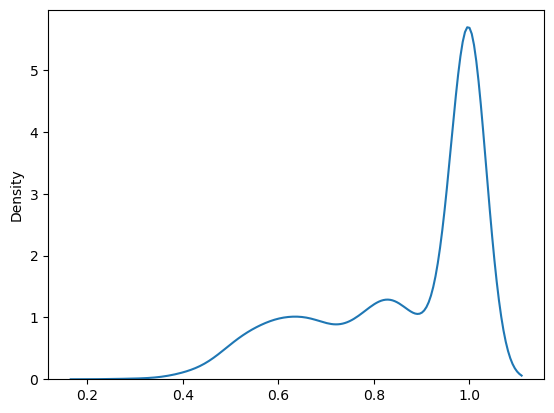

In [15]:
list_min = []
for i in tanimotos_sumary:
    for x in tanimotos_sumary[i]:
        list_min.append(x[2])
sns.kdeplot(list_min)

So, in the majority of cases we do not have to worry, as the minimum Tanimoto average value is above 0.8, but there are some cases that we should carefully look at as they have a low value. 

Side note: 

the cell below just gives some clusters that we need now for training the ML model.

In [13]:
slice_tanimotos = []
for key in range(100,200):
    if str(key) in tanimotos_sumary:
        slice_tanimotos.append(tanimotos_sumary[str(key)])
        print(tanimotos_sumary[str(key)])

[('P04585', 0.882162575949344, 0.7014034576534579)]
[('P07900', 0.8477895057567234, 0.44931322723289147)]
[('P29476', 0.9910212201591513, 0.5392954336304089)]
[('P03367', 0.997326575233552, 0.8368840461863714)]
[('P03366', 0.9084056367153361, 0.6942318272927669)]
[('P00734', 0.817303234808151, 0.6412340014395503)]
[('P00918', 0.9255953492943322, 0.4526265386284602)]
[('Q16539', 0.9056618467506456, 0.5091753115745271)]
[('P56817', 0.7396620941383005, 0.5310951550913161)]


this is just for nuria.

P03367;["1a8g","1a8k","1a94","1d4s","1d4y","1daz","1dif","1hni","1hpo","1hpx","1hsg","1hvl","1iiq","1izi","1m0b","1mrw","1mrx","1msm","1msn","1rl8","1sdt","1sdu","1sdv","1sgu","1sh9","1upj","1xl2","1xl5","1zj7","2a1e","2az8","2az9","2azb","2b7z","2bb9","2fde","2hc0","2hnd","2hny","2ien","2o4p","2p3b","2pk5","2pk6","2pqz","2pwc","2pwr","2pym","2pyn","2q63","2q64","2qak","2qci","2qd6","2qd7","2qd8","2qhc","2qnn","2qnp","2qnq","2r43","2upj","2z4o","3a2o","3bhe","3bva","3bvb","3ckt","3djk","3dk1","3fx5","3ggu","3i6o","3jvw","3jvy","3jw2","3kdb","3kdc","3kdd","3ndu","3ndw","3ndx","3nls","3pwm","3pwr","3qbf","3qih","3qn8","3qp0","3qpj","3qrm","3qro","3qrs","3st5","3t11","3t3c","3tof","3tog","3toh","3ttp","3ucb","3ufn","3uhl","3vf5","3vf7","3vfb","4dfg","4fe6","4gb2","4hdb","4hdf","4hdp","4heg","4hla","4j54","4j55","4j5j","7upj"];


In [16]:
cases_to_look_at = []
for i in tanimotos_sumary:
    for x in tanimotos_sumary[i]:
        if x[2] < 0.8:
            cases_to_look_at.append((i, x))
            

In [14]:
len(cases_to_look_at)

681

This can seem a lot, but let's take into account that we are comming from 5500 UniProt proteins... Then we eliminated 3000 that have a single PDB structure. From these other 2500, we are saying that around 1850 can be considered to be homogeneous and we can take one protein as representative.

In [22]:
clusts_1 = PDB_maping_df.loc[PDB_maping_df['len_int'] == '1']
with open('PDBs_1cl.txt', 'w') as fout:
    for i in clusts_1.PDB_codes:
        fout.write(i[0]+'\n')


In [23]:
fout.close()

In [15]:
straight_cases = []
for i in tanimotos_sumary:
    for x in tanimotos_sumary[i]:
        if x[2] >= 0.8:
            straight_cases.append((i, x))

In [16]:
straight_cases

[('32', ('P20906', 1.0, 1.0)),
 ('38', ('P00327', 1.0, 1.0)),
 ('35', ('O92972', 1.0, 1.0)),
 ('95', ('P15121', 0.8569739952718675, 0.8222119436735532)),
 ('7', ('P49336', 0.9259259259259259, 0.8148148148148148)),
 ('7', ('P09546', 1.0, 1.0)),
 ('7', ('Q14376', 0.9210526315789473, 0.8026315789473685)),
 ('7', ('Q86X55', 0.8604651162790699, 0.813953488372093)),
 ('7', ('Q9AGY4', 1.0, 1.0)),
 ('7', ('Q3JRA0', 0.8648648648648649, 0.8198198198198199)),
 ('7', ('Q48485', 1.0, 1.0)),
 ('7', ('P29373', 0.9473684210526315, 0.8684210526315789)),
 ('7', ('O57693', 1.0, 1.0)),
 ('7', ('Q27743', 1.0, 1.0)),
 ('7', ('Q13126', 1.0, 1.0)),
 ('7', ('P0AFG8', 1.0, 1.0)),
 ('7', ('Q49492', 0.9285714285714285, 0.8214285714285713)),
 ('7', ('O34453', 1.0, 1.0)),
 ('7', ('P07547', 0.88, 0.84)),
 ('7', ('Q97ML2', 1.0, 1.0)),
 ('7', ('Q8X1D8', 1.0, 1.0)),
 ('7', ('P11766', 0.9852941176470589, 0.9852941176470589)),
 ('7', ('P0A6R0', 0.9916666666666667, 0.9791666666666666)),
 ('7', ('P0A3R9', 0.959349593495935

In [12]:
mol = next(pybel.readfile('mol2', '../db/scPDB/1ke6_1/protein.mol2'))
tresidues = [x for x in openbabel.OBResidueIter(mol.OBMol)]
        

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ke6_LS2_1_protein)

/home/marc/anaconda3/envs/SBI_project/lib/python3.11/site-packages/openbabel/__init__.py:14: UserWarning: "import openbabel" is deprecated, instead use "from openbabel import openbabel"
  warnings.warn('"import openbabel" is deprecated, instead use "from openbabel import openbabel"')


In [14]:
mol.OBMol.NumResidues()

297

In [15]:
len(straight_cases)

1540

In [30]:
dummy_codes = PDB_maping_df.loc[PDB_maping_df['UniProtID'] == straight_cases[1][1][0]]['PDB_codes']

In [46]:
numb_residues = []
for i in dummy_codes:
    for x in i:
        for folder in glob.glob('../db/scPDB/'+x+'*/'):
            mol = next(pybel.readfile('mol2', folder+'protein.mol2'))
            numb_residues.append((mol.title, mol.OBMol.NumResidues()))
            

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a71_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a72_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adb_CND_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adc_PAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1adf_TAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1axe_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1axg_NAD_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1het_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dxh_NAJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nfh_PFB_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nfh_NAJ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nfs_NAJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ng5_NAJ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ng5_PFB_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xd2_NAI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5adh_APR_1_protein)

*** Open Babel Warning  in ReadMolecule


In [47]:
max(numb_residues, key=lambda i: i[1])

('1lde_NAD_5_protein', 1589)

For the straightforward cases:

I will read all the pdb files of each cluster, get the number of residues and get the structure with more residues.

In [9]:
def get_large_struc(list_pdbs):
    numb_residues = []
    for i in list_pdbs:
        for folder in glob.glob('../db/scPDB/'+i+'*/'):
            mol = next(pybel.readfile('mol2', folder+'protein.mol2'))
            numb_residues.append((mol.title, mol.OBMol.NumResidues()))
    return max(numb_residues, key=lambda i:i[1])[0]
    

In [85]:
structures_to_use = []
for case in straight_cases:
    pdbs_ = PDB_maping_df.loc[PDB_maping_df['UniProtID'] == case[1][0]]['PDB_codes']
    pdb_list = [x[1] for x in pdbs_.items()]
    structures_to_use.append(get_large_struc(pdb_list[0]))

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bfd_TPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mcz_TDP_25_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mcz_RMN_26_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pi3_TZD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1po7_TZD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fn3_TZD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fwn_TDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3w_TPP_3_protein)

*** Open Babel Warning  in ReadMolecul

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hld_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ju9_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1lde_NAD_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mgo_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qlh_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2jhf_NAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-st

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hky_IX6_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lkh_LT6_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mww_BIW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ska_053_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ske_054_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3skh_058_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tyv_HI3_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3u4o_08E_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fz8_ZST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fz9_ZST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fzb_TOL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fzd_TOL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hv5_ZST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hvn_ZST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hvo_ZST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2i16_LDT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m64_393_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mb9_ZST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mc5_393_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p2v_DOY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3q65_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3q67_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s3g_TLT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t42_3T4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3jvh_HHV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k14_535_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k2x_I5A_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ke1_829_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p0z_CTN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wam_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bi7_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bi8_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ug5_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ug5_XFK_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ug7_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ug7_1EV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ug9_1EW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4uga_Q05_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4uga_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4uqs_INE_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2g0l_FLN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ej2_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1m8g_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1m8j_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1m8k_NAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yp5_NAP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yp6_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yp7_NAP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3i8p_840_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pg3_PRX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p20_PRX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p2b_COA_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p2b_PRX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p2f_COA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p2j_PRX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p2m_PRX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gee_0WT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gfn_SUY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ggl_CJC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hxw_1A0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k4o_DOO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ksg_920_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ksh_HTT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1l0l_FMX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bvr_THT_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bvr_NAD_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eny_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1enz_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p44_GEQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p44_NAD_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p45_TCL_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zid_ZID_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k4g_AIQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k4h_APQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n2v_BDI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ozq_PRF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p0b_PQ0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p0e_PRF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pxg_PRF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q2r_9DG_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r07_W33_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rm2_W43_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rr1_W8R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rs1_W84_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rs3_W59_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rs5_W56_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fv0_9AR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kpm_VIT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mkf_AP5_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mkg_AP5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mkh_AP5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qbf_AP5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qbg_AP5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4typ_AP5_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4tyq_AP5_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2djl_FMN_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uzz_TES_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hb3_GRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hs1_017_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hs2_017_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2i4u_DJR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2idw_017_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ieo_017_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2nmy_ROC_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4o1y_NLA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5p2p_DHG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vz0_D64_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd7_VGD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd8_VGF_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x9g_LYA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x9n_AX3_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x9v_TMQ_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4flk_Y10_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fll_YZ6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 4hxx_1AY_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CO as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 4hxx_1AY_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CO as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jt6_DEQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jtx_CVI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jty_ET_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jum_BER_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jup_MGR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jus_RHQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qvt_PRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qvu_PRL_2_protein)

*** Open Babel Warning  in ReadMolecule
 

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ew2_DXY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ew3_DXZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pgp_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4klv_KLV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kos_4KO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kot_CE3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kou_C04_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kov_KOV_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gsz_R71_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h35_R01_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h36_R88_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h37_R02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h39_R03_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h3a_R04_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h3b_R46_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h3c_R79_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5a4k_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5eai_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pum_CAQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qqt_AIN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gck_BHO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gcl_AIN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3py4_TYL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3r4x_PZA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h4u_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h4v_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h4w_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h4w_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h4x_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h4y_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h4y_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h4z_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zsb_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zsd_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zse_ACP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3aez_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3af0_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3af1_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3af2_ACP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3af3_GCP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k1u_0Q4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k2b_0Q4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k2c_0Q4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1odx_0E8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1tcx_IM1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2aoe_0Q4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2avm_2NC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2avs_MK1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e8s_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ed3_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ed5_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eeq_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2egb_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2egl_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2egs_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2eh2_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2owu_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2owv_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p2x_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p5c_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p5f_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p6d_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p6i_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p6k_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yvg_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yvj_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yvj_NAI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ync_YNC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yne_NHW_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yne_YNE_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4a95_9MT_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4a95_NHW_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5fwg_GPR_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 6gsu_GPS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 6gsv_GPS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 6gsw_GPS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 6gsx_GPS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jla_TPP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jlc_TPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hwx_TPP_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4emr_MGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jtp_ASC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kpv_URA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lwx_MU2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zz6_CTP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5ilw_URI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ivu_ZD6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ivv_PP1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dz2_A8M_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dz4_C8M_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dz6_M8E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dz7_O8M_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3h0v_M2T_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3h0w_N8M_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k6c_MK1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k6p_XN3_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c94_TSF_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c97_JCL_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c9b_PUG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c9d_PHR_8_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vi5_Y19_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n0u_SO1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u2r_SO1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zm4_TAD_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5imi_JF1_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5imn_JF1_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5imp_JF1_4_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1c23_MPH_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CO as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1c23_MPH_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CO as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2ggb_U17_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CO as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ggb_U17_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p98_YE7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p99_YE6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p9a_YE6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bond

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gtp_7TP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gtr_7TR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jr4_CL4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cl5_BIE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zth_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zvj_KOM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3a7d_FBN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hvi_619_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yx1_SFG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zzm_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zzn_SAM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wq4_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wq5_ATP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ydu_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1b7t_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kqm_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k6m_SAH_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j0j_E35_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j0k_EGR_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jui_EGR_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zcx_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zdf_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4boy_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mn6_ATP_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pg0_MOD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pg2_ADN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oev_3OE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sdi_3SD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sdk_P3N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ejg_NCT_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ejh_0QA_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4eji_0QA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jae_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jb1_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jb2_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bsw_CAO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jdc_CAO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jdd_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fhd_0TT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fhf_0TT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oev_3OE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sdi_3SD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sdk_P3N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uad_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zc3_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zc4_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xsh_DC5_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yfj_1IT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2f2c_AP9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g9r_UPF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ga8_UPF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ss9_UPF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1udy_FAD_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mdd_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mde_CO8_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2npi_ATP_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2foi_JPA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ige_CHJ_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4igf_CHV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jtk_THU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uwz_THU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ux0_THU_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hsj_6PC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hvr_SAL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3px3_T3Q_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2aq7_TL5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2aqb_TL6_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vb8_TLM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h5r_THM_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h5s_TMP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h5t_DAU_8_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h5t_TYD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hdr_DMD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hds_IPH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qkn_RAL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2j7x_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2j7y_E3O_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wme_NAP_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xdr_NDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zqa_NDP_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cb3_APR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cb5_APR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5cms_APR_10_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1v0c_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bue_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vqy_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q1r_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q1w_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nw5_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nw6_SFG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfn_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cz7_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3q33_ACO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hdm_PCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hdr_DMD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hds_IPH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fpy_ADP_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hp2_KE4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fqa_GAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gsb_GAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2b82_ADN_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2b8j_ADN_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: AU as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-st

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p1b_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1p1c_SAH_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: GD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p1c_SAH_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6n_UPG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y6u_UPG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y9x_UPG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1q99_ANP_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1q99_ANP_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q99_ANP_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1qy1_PRZ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vyq_DUX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t64_DU3_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t70_DU4_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d7l_RFL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d7l_PHB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k0j_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k0l_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1emd_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bpo_FAD_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bpo_NAP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zhp_BEN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zsk_421_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sor_O58_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1of0_EBS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4q8b_SXX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yvn_EBS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ahe_THD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ahi_HTL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ahj_TPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ou2_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ou6_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ou7_SAM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r1r_TTP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3r1r_ATP_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bw2_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bw3_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bw4_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ydd_MD1_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ydd_MGD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5ch7_MD1_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5ch7_MGD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5e7o_MD1_8_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2dbz_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oev_3OE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sdi_3SD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sdk_P3N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xa4_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xvt_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xvv_CCQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1woo_THG_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5c3j_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5c3j_UQ1_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1s2d_ADE_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1s2g_3D1_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1s2i_BP1_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3icr_COA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3icr_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ics_ADP_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sdk_P3N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qds_MCO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3iof_IFS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3iog_SDF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1e3e_NAI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1e3i_CXF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1e3l_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a4f_AAU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3keo_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3keq_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ket_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ffl_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ffm_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ffr_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vn1_FK5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j4n_D44_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gi5_K62_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gi6_D78_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hzc_2NC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3i2l_2NC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3i7e_DJR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lzv_017_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mxd_K53_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mxe_K54_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kw5_1W6_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cb4_MGT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cb5_93G_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cb6_29R_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cb7_41G_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2b69_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gll_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lk3_NAD_9_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vrj_NCW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wbg_LGS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fw3_BUI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ep9_0RD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4eph_0RK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4eyw_L0R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hvi_A77_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zp8_AB2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1tw4_CHD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jn3_JN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2k62_ITL_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: YB as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2k62_ITL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2lfo_GCH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2lfo_CHO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5jqg_GTP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a9x_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bxr_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jdb_ADP_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t36_ADP_10_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hld_ANP_8_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oee_ANP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oeh_ANP_2_protein)

*** Open Babel Warning  in ReadMolecule

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tq9_MTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tqa_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tqb_FOL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3jsu_KA5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qg2_CP6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dp3_MMV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dph_P65_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1l0o_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v7q_ADP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4asu_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2d06_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qvu_NPO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qvv_3QV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3u3o_3QV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zrk_ZRK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zrl_ZRL_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bnp_MST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bns_MST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3i4d_UQ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4tqq_UQ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ez3_IPE_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ez3_ZOL_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ldw_IPE_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ldw_ZOL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kr2_TAD_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1djn_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1djq_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1djq_ADP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o94_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tmd_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1isg_AGS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1isi_NCA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mv4_ACP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mv8_ACP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nai_URF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sfg_2TU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sfu_RBV_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3upf_0BU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wyg_SAL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wyg_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nt6_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nt6_COA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nta_COA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nta_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ntd_COA_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ntd_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ocg_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ocg_COA_4_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4b8u_IBK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hna_GDN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hnc_GDN_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c4j_GSO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gur_BYG_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v0i_UD1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vd4_P21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2w0v_LZR_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1ur5_NAD_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1ur5_NAD_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1ur5_NAD_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ot2_NPS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zbq_DIF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zbr_NPS_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zbr_DIF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5dby_NPS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5dby_DIF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i24_UPG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i2b_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h5t_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ko3_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ko5_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nbi_D3Y_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nbj_D3Y_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vrq_FMN_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vrq_FON_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1x31_FMN_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u22_THG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4at0_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4at2_ASD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ci6_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5ce3_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5ce3_ATP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fe4_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ffq_GSP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1s4o_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1s4p_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cer_NAD_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2g82_NAD_7_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zdb_CAA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zdc_CO8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ks7_X4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ks8_B49_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zt5_B4P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zt7_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qem_QEM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5ewj_QEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d4p_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3h3j_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4g31_0WH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4g34_924_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mpi_FAD_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mpi_GRA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mpj_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mdh_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5mdh_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xnh_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xpd_ACO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kpu_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sxj_SAM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t0i_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jk4_DIU_7_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4or0_NPS_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j16_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j16_NAP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j1t_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j1t_NAP_4_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kjg_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kji_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u9q_186_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4klb_1RV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dm6_TTB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dm8_REA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l77_NJP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tn7_NJP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wuq_8GT_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wur_8DG_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nrc_TCL_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uic_09T_11_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uic_NAD_17_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kf6_HQO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kf6_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kx6_FAD_2_protein)

*** Open Babel Warning  in ReadMolecul

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2aa3_AP0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1llq_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o0s_NAI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dfo_FFO_8_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dfo_PLG_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eqb_FFO_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3u9e_COA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uf6_COD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r6g_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ki0_ANP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kp2_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kp3_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nv0_MG7_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nwi_CTN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pag_FMP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qcj_APT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2dki_FAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: XE as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2dki_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3q2a_PAB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3q3n_NPO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j16_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j16_NAP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uz1_TPP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d7k_D7K_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e7f_C2F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ogy_C2F_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2r9z_FAD_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2r9z_FAD_2_protein Cannot interpret atom types correctly, instead attempting to interpret

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lq2_TDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lq4_TDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xjq_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xnj_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3a25_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3a26_MTA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 4x9m_FAD_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oe1_TDL_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zp1_TPP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2giv_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2y0m_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3g5q_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3g5s_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ixa_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ixb_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cvz_NDP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2i80_G1L_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2i8c_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ebl_GA4_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ed1_GA3_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ci7_UMP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ci7_CB3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1f28_F89_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3i59_N6R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3i59_N6S_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mzh_CMP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fbc_TYD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fbe_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tut_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3tw3_ATP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CO as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e2q_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l5t_956_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3l5u_ZEC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w73_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w8d_NAP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jk6_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2w0h_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2w0h_NDP_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2apc_UDM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hze_RBF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pkv_RBF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3phi_NDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3phj_DHK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n4h_REA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nq7_ARL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zw4_COA_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cnf_MTA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cng_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p8z_36A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p8z_SAH_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3p97_SAM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5da9_AGS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5dac_AGS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5dac_AES_4_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bbd_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bbh_SFG_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d2d_REN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ec3_REN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vsv_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cif_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fp6_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xd9_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2j4k_U5P_5_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2j4k_U5P_5_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2j4k_U5P_5_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1so2_666_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1soj_IBM_7_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xyb_NDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xye_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pmn_K51_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pmo_HMD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4id9_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4idg_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4s1h_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4s1i_PLP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4a7y_NHF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4a7z_AY9_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bj7_COA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bj8_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lcu_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lcv_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pab_THG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4eb5_PLP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4eb7_PLP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gv8_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gv8_NDP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gvc_FAD_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gvc_MMZ_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gki_CLR_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2mm3_CHO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2mm3_GCH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uyk_0CX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uyl_TYD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kqq_VPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kqq_IMD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kqr_VPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kqr_IMD_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3a3b_RBF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3a3g_DLZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4amb_DUD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4an4_DUD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v3h_I25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o48_AC6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2poq_ISD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1b5d_DCM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1b5e_DCM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nue_GDP_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bbf_GDP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nbb_9CA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nbh_9CA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ipe_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ipf_TNE_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1lww_BRG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1m3q_ANG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2c_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a2d_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5ftc_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5ftf_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z2n_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z2p_ACP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5g3t_FDA_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5d4u_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5d4v_YGP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5d4v_SAH_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4g27_PHU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4g28_0W8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fr0_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fr1_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2dfv_NAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gq3_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3saz_043_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u7w_CTP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u80_C5P_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u8f_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1znq_NAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yag_NAI_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p0m_RS7_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3f0a_ACO_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f0a_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k9u_ACO_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3g7j_GTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ymu_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ymv_ATP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2i0a_MUI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2psu_MUU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cx8_SAH_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2z0y_SAM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rgj_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1e94_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ht2_ADP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5bsf_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5bsg_NAP_10_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qzf_CB3_7_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qzf_FOL_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sej_F89_9_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3q2a_PAB_2_protein)

*** Open Babel Warning  in ReadMolecule

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tif_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3x1w_GDP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3x1w_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3x1z_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4c3x_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4c3y_FAD_9_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w5t_ADP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ahg_TYR_PLP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1arg_PPD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1arh_PPD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1asb_MAE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1asc_NPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cq6_PY4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cq7_PY5_1_protein)

*** Open Babel Warning  in ReadMolec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v7q_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v7q_ADP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4asu_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dvi_2IW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4i9i_1DY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k4e_K4E_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k4f_K4F_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4krs_1SX_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ht5_FL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ht8_34C_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q4g_BFL_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ayl_FLP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2oye_IM8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2oyu_IMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kk6_CEL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n8w_FLP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c14_FOK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c14_GSP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c15_GSP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c15_FOK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c16_FOK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c16_GSP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3maa_FKP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ke8_EIP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u0h_ONM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u0h_FOK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u0h_GSP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gvd_GSP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gvd_FKP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c14_FOK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c14_GSP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c15_GSP_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tdd_THF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tdm_UMP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bnz_C16_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3byx_C00_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bz0_C00_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c06_14C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c0a_14C_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ijz_15C_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fds_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdt_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdu_EST_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdu_NAP_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fdw_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i5r_HYC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1iol_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jtv_TES_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kmm_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mk4_CHD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wpg_TG1_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wpg_ADP_7_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2agv_BHQ_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2agv_TG1_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c8k_TG1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2dqs_TG1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zoy_UQ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ae4_N1M_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ae4_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3aeb_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3aeb_F7A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sfd_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sfe_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yxd_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c31_TZD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c31_ADP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ji6_OXK_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ji6_TPW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ji6_ADP_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ji7_OXT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ji7_ADP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ji8_FYN_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xz3_ACP_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y8v_ADP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yak_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yak_ACO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5hbr_COA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d8v_UD1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3dj4_UD1_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CO as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xq9_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xqc_NAD_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xqg_1PS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xrg_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uov_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uox_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uoy_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uoy_NAP_4_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p9k_ATP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dxk_N23_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dxm_N24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ukr_CKH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uku_C69_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ule_ATP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ule_C69_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ajp_88N_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1rm5_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pkr_NDP_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zx5_ZX5_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zx6_ZX6_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zx7_ZX7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zx8_ZX8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zx9_ZX9_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zxb_ZXB_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ukr_CKH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uku_C69_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ule_ATP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ule_C69_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ebi_BEY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3q43_D66_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3q44_D50_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t8v_BTJ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4izy_1J2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jsc_TPP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jsc_FAD_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n0h_CIE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t9a_YF4_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t9a_1TB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t9a_P23_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t9b_1CS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1upb_TPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1upc_TPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2iht_TPP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ihu_TP9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ihv_TPP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fmw_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jx2_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mma_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1m1d_LYX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pu9_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pua_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qsn_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qsr_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5gcn_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qvy_34Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qvz_3BZ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k47_D09_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qzs_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r4t_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r4u_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cop_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cx4_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3guh_ASO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xb8_XNW_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lj3_WYE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml8_ML8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ml9_ML9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pre_3RE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qaq_QAQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qar_QAR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qk0_QK0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s2a_2NQ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2r_COM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2r_COM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m2r_COM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2u_COM_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pj4_ATP_5_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1pjl_NAD_16_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: LU as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1pjl_NAD_16_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: LU as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pjl_NAD_16_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file 

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m1v_COM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m1v_COM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m1v_COM_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3m2r_COM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1e92_HBI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bf7_HBI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bfa_CB3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bfm_TOP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bfo_NDP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bfp_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qhx_FE1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3h4v_DVP_5_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jcq_739_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ld7_U66_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ld8_U49_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mzc_BNE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1s63_778_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sa4_JAN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2f0y_3MN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2h6i_CYS_VAL_LEU_SER_GER_1_protein)

*** Open Babel Warning  

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3o0q_TTP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o2q_NAP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o2r_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rhj_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rhl_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rho_NAP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rhq_NAP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rhr_NDP_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 5a0y_COM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 5a0y_COM_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5a0y_COM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jvs_NDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sdu_MK1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sdv_MK1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sgu_MK1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sh9_RIT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1upj_U01_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xl2_189_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xl5_190_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zj7_0ZT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ndx_RIT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nls_016_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pwm_017_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pwr_ROC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qbf_JHG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qih_NI7_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qih_FG7_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qn8_NI7_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wu5_CBE_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d6n_PPO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hmp_5GP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gep_24H_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ggc_H26_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ggj_25H_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dpm_EBP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eyw_TEN_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a4l_DCF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fkw_PUR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fkx_PRH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uio_HPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ada_HPR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ee1_DND_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ifx_DND_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ih8_APC_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2kmn_BB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k6l_2BB_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3k6l_2BB_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k6l_2BB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (ti

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fmx_CNL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4l6g_CNL_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4l77_CNL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lht_CNL_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nen_DNT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wdq_CBE_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wp9_CBE_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wu2_CBE_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cde_DZF_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cde_GAR_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gar_U89_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jkx_138_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xxv_KAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xxy_KAI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bdo_KAI_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bdr_KAI_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1llw_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1llz_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1lm1_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ofd_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ofe_FMN_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2b5v_NAP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vwg_LGC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vwh_NAP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c1y_2BA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c21_2BA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c23_3AT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yvz_3AT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yxm_2BA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ryf_GTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ryh_GTP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ut5_LOC_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hpt_BES_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zxg_S23_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4q4e_BB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xmx_BES_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m6p_BB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m6q_BB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m6r_BB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3o3j_BB4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eir_BPY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kw6_BPY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kw8_BPY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kw9_BPY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kwc_BPY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3biy_01K_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bhw_01K_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pzr_COA_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fu8_2UP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fub_4UP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fud_6UP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fue_7UP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fuf_8UP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fui_UI3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fuj_1U9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jnk_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dqe_017_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dqf_017_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dqh_017_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k4p_3TL_1_protein)



In [88]:
with open('PDBs_big_cl.txt', 'w') as fout:
    for i in structures_to_use:
        fout.write(i+'\n')
#structures_to_use

## Manually looking at the clusters with less similarity

We need to find a way to look and review these clusters were we find lower simialrity.

In [17]:
cases_to_look_at

[('63', ('P00517', 0.7867474201007459, 0.49183826039161044)),
 ('63', ('Q15596', 0.7082380380287028, 0.49277782307926055)),
 ('111', ('P04585', 0.882162575949344, 0.7014034576534579)),
 ('44', ('P01112', 0.9726064633041378, 0.6150701380825773)),
 ('44', ('O15530', 0.7915178204736895, 0.6060216025066414)),
 ('32', ('P00720', 0.6894448949001252, 0.5181711895479401)),
 ('62', ('Q15788', 0.7150882217341791, 0.4550231283691851)),
 ('51', ('P61925', 0.7824019324207291, 0.4860672575763003)),
 ('55', ('P00374', 0.9772836939503606, 0.6632716049382714)),
 ('7', ('Q7Z1V1', 0.7873975794837831, 0.619530605951909)),
 ('7', ('P07256', 0.8131868131868133, 0.671957671957672)),
 ('7', ('P08525', 0.8131868131868133, 0.671957671957672)),
 ('7', ('P0A1F6', 0.8359574690970041, 0.7726098191214471)),
 ('7', ('P19821', 0.6145833333333334, 0.5)),
 ('7', ('P13726', 0.8156565656565656, 0.6574074074074074)),
 ('7', ('P00163', 0.8131868131868133, 0.671957671957672)),
 ('7', ('Q99835', 0.6152113652113652, 0.48836980

In [17]:
look_at = {}
for i in cases_to_look_at:
    look_at[i]  = pd.read_csv('clusts_out/clusts_l'+i[0]+'/'+i[1][0]+'.csv', sep=';', skiprows=4, names=['x', 'y', 't'])
       

In [19]:
look_at

{('63',
  ('P00517',
   0.7867474201007459,
   0.49183826039161044)):          x     y         t
 0     1q24  1q8t  0.580000
 1     1q24  1q8u  0.725000
 2     1q24  1q8w  1.000000
 3     1q24  1stc  0.800000
 4     1q24  1sve  0.725000
 ...    ...   ...       ...
 1948  4c34  4c36  0.609756
 1949  4c34  4yxs  0.553191
 1950  4c35  4c36  0.543478
 1951  4c35  4yxs  0.591837
 1952  4c36  4yxs  0.815789
 
 [1953 rows x 3 columns],
 ('63',
  ('Q15596',
   0.7082380380287028,
   0.49277782307926055)):          x     y         t
 0     1gwq  1gwr  0.475000
 1     1gwq  1m2z  0.585366
 2     1gwq  1mvc  0.555556
 3     1gwq  1mzn  0.594595
 4     1gwq  1p93  0.604651
 ...    ...   ...       ...
 1948  4zn7  5dxg  0.939394
 1949  4zn7  5hyr  0.939394
 1950  5dx3  5dxg  0.939394
 1951  5dx3  5hyr  0.939394
 1952  5dxg  5hyr  1.000000
 
 [1953 rows x 3 columns],
 ('111',
  ('P04585',
   0.882162575949344,
   0.7014034576534579)):          x     y         t
 0     1bv7  1bv9  1.000000
 1     1bv

In [18]:
look_at_summary = {}
for i in look_at:
    interesting_lines = look_at[i].loc[look_at[i]['t'] < 0.8]
    look_at_summary[i] = interesting_lines

In [50]:
look_at_summary

{('63',
  ('P00517',
   0.7867474201007459,
   0.49183826039161044)):          x     y         t
 0     1q24  1q8t  0.580000
 1     1q24  1q8u  0.725000
 4     1q24  1sve  0.725000
 5     1q24  1svg  0.580000
 7     1q24  1szm  0.675000
 ...    ...   ...       ...
 1944  4axa  4c35  0.591837
 1948  4c34  4c36  0.609756
 1949  4c34  4yxs  0.553191
 1950  4c35  4c36  0.543478
 1951  4c35  4yxs  0.591837
 
 [1112 rows x 3 columns],
 ('63',
  ('Q15596',
   0.7082380380287028,
   0.49277782307926055)):          x     y         t
 0     1gwq  1gwr  0.475000
 1     1gwq  1m2z  0.585366
 2     1gwq  1mvc  0.555556
 3     1gwq  1mzn  0.594595
 4     1gwq  1p93  0.604651
 ...    ...   ...       ...
 1942  4ruo  5hyr  0.553191
 1943  4udc  4zn7  0.510204
 1944  4udc  5dx3  0.510204
 1945  4udc  5dxg  0.500000
 1946  4udc  5hyr  0.500000
 
 [1640 rows x 3 columns],
 ('111',
  ('P04585',
   0.882162575949344,
   0.7014034576534579)):          x     y         t
 6     1bv7  1c0u  0.772727
 7     1bv

In [51]:
with open('look_at_clusters.txt', 'w') as writ_out:
    for i in look_at_summary:
        writ_out.write('####################\n'+str(i)+'\n')
        look_at_summary[i].to_csv(writ_out, mode='a')
            #writ_out.write(line+'\n')
writ_out.close()

So, i finally decided to just put everything into a text file and manually look at all clusters. I will open in Pymol some of the strucutres for each cluster that are more dissimilar and decide what to do.

After having a look at all the clusters, i have seen that in all cases it seems that the strucutres are for the same protein and i haven't observed at first glance an important conformational change that we should be taking into account. This does not mean that there will be, of course, different conformations and that they may open and close pockets. We will be loosing this becasue I cannot find a way of distinguishing it more than manually looking at all strucutres. Now, when we see the most dissimilar ones what we usually find are bigger changes. These changes are usually that in some of the files we have the protein as dimer and others are monomers, or complexes with i.e. cholesterol and another lipid, or if they interact with DNA there is the DNA at some of the strucutres.... 

It is important to note that we will need to try and clean the strucutres we decide to use to train the model: we probably don't need a complex with a fatty acid to be there, or the DNA in a TF crysyal, or small organic molecules that are just added to stabilize the structure. 

We have also decided that for the chosen strucutres, if they have more than one pocket, we will add them separately: this means that if we have chosen the PDB XXX and it has more than 1 pocket we will load to the training the XXX_1, XXX_2... as they are in different folders.


In [25]:
structures_to_use_2 = []
for case in cases_to_look_at:
    pdbs_ = PDB_maping_df.loc[PDB_maping_df['UniProtID'] == case[1][0]]['PDB_codes']
    pdb_list = [x[1] for x in pdbs_.items()]
    structures_to_use_2.append(get_large_struc(pdb_list[0]))

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q24_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q8t_Y27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q8u_H52_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q8w_M77_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1stc_STU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sve_I01_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1svg_I04_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1svh_I08_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kkv_B99_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zo1_SIJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zo4_QWI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4axa_RKD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4c34_STU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4c35_NU3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4c36_ZO9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yxs_EMU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4k6i_9RA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m8e_29V_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4m8h_R4M_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nie_NBH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nie_DMX_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4p6w_MOF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4p6x_HCY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ple_CPS_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1rev_TB9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1rt1_MKC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1rt2_TNK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1rt3_U05_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1rt4_UC1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1rt5_UC2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1rt6_UC3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1rt7_UC4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lp2_LP9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m8p_65B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m8q_DJZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mec_65B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3med_65B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mee_T27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3meg_T27_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nbp_JGZ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nyi_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nyj_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xvq_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xvr_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5b2z_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h1w_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oky_STU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1okz_UCN_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3NY8_LIGPROTBWATER_PROTEIN)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3NY9_LIGPROTBWATER_PROTEIN)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3NYA_LIGPROTBWATER_PROTEIN)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3odu_ITD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3OE9_LIGPROT_PROTEIN)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3P0G_LIGPROT_PROTEIN)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3PBL_LIGPROT_PROTEIN)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3QAK_LIGPROT_PROTEIN)

*** Open

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yye_196_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zaf_789_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a3i_C0R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fvj_RO0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gtk_208_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hbh_XE4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hc4_VDX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hcd_BIV_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c1a_I5S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c1b_CQP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2f7e_2EA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gni_M77_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jds_L20_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jdt_I5S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jdv_L20_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uvy_GVI_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dhf_FOL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dlr_MXA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dls_MTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1drf_FOL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hfp_MOT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hfq_MOT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hfr_MOT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kms_LIH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wuz_TPF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wx2_TPF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k1o_POZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3khm_TPF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zg2_UDO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zg3_UDD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h6o_NEE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ezv_UQ6_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p84_DBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p84_UQ6_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ibz_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ibz_UQ6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cx5_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cxh_SMA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jkv_1KS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4N4W_LIGPROT_PROTEIN)

*** Open Babel Warning  in ReadMolecul

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3pdq_KC6_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pdq_KC6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3rvh_HQ2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rvh_HQ2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ibz_UQ6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cx5_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cxh_SMA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ndj_JHZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e2w_JHZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e2x_TYD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e2x_SAH_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e2y_JHZ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ezv_UQ6_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ezv_SMA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kb9_SMA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kb9_UQ6_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kyo_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p84_DBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p84_UQ6_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ibz_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kb9_UQ6_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kyo_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p84_DBT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p84_UQ6_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ibz_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ibz_UQ6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cx5_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cxh_SMA_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ez5_0RS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwf_NAP_7_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwh_KMP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qwi_CUE_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fiz_CUE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fj0_HHF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fj0_NAP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fj1_GEN_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ibz_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ibz_UQ6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cx5_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cxh_SMA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zz7_S0H_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zz8_S0H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3scf_S0H_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3scg_TB6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qoh_STL_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qoi_ML1_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4u7g_K17_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4u7h_K25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zvl_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zvm_DM2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zvn_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5lbu_C09_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q36_KAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q36_ATP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q97_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v51_ATP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v51_LAB_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v52_LAB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3buz_TAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3buz_LAR_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f8s_PF2_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3g0b_T22_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3g0c_RUF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3g0d_XIH_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3g0g_RUM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3opm_LUI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qbj_NXZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3vjk_M51_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2aa7_1CA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2aax_PDN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ab2_SNL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2abi_1CA_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2oax_SNL_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3vhu_SNL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3wff_WFF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3wfg_WFG_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n95_FTH_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1n95_HFP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ni1_HFP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ni1_2C5_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nl4_HFP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o1s_1NH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o1t_2NH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o5m_336_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ce2_BO5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ce3_L4V_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ftl_DNQ_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fw0_KAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1lb9_DNQ_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1lbb_KAI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1lbc_CYZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cmo_M1L_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4i0a_CMP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4i0b_CMP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4r8h_SP1_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mkd_ZAR_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oyn_ROL_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q9m_ROL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1tbb_ROL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xom_CIO_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e98_B29_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e99_B08_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e9a_B28_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e9c_B75_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e9d_B76_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sgv_2BJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sgx_0FW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sh0_SAX_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sqn_NDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sr7_MOF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zuc_T98_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ovh_AS0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ovm_AS0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2w8y_486_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2w8y_NDR_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d90_NOG_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ojw_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ojw_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ojx_NAP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ojx_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ojx_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y7c_FMN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y7c_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4y7c_NAP_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rtk_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rtl_SFG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rtm_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rtn_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rto_SFG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rtp_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rtq_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rtr_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jgs_BTN_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3vgw_NVZ_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3vhh_VHH_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3vhi_VHI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3vhm_NPK_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qy8_RDI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u0z_RDC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u2o_NEC_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ngc_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ngd_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nge_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ngh_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ngi_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ngj_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qwl_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qwn_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xjj_L81_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xjx_XJX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xk2_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ye4_2FY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ye6_2AE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ye9_2D4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yec_XQ0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yee_2EC_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4awq_592_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4b7p_9UN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bqg_50Q_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bqj_XKL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4eft_EFT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4efu_EFU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4egh_0OY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4egi_B2J_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pkd_UCN_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pxj_CK2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pxk_CK3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pxl_CK4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pxm_CK5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pxo_CK7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pxp_CK8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pye_PM1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r3l_SCW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r3m_SCX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r3o_2SC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r3p_3SC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r3q_5SC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r3r_6SC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r64_740_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uzb_C75_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qqg_X06_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qqh_X0A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qqk_X02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qql_X03_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qrt_X14_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qru_X19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtq_X35_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qtr_X36_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rni_21Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3roy_22Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rpo_24Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rpr_25Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rpv_26Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rpy_27Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rzb_02Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s00_Z60_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4i3z_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ii5_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kd1_1QK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lyn_1YG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nj3_2KD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5ani_ES4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pjk_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pvr_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdv_37U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zf0_51U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zff_53U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zfp_19U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgb_21U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zgx_29U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zhq_27U_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zi2_24U_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yfe_YFE_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zno_S44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cs8_BRL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gbk_2PQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3h0a_D30_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3h0a_9RA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lmp_CEK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3v9t_17L_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1swg_BTN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1swn_BTN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1swp_BTQ_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1swp_BTN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1swr_BTN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1swt_BTN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2izf_BTN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2izg_BTN_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xp6_AIU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xp9_AIJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xpc_AIT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xqc_AEJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yim_CM4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yin_CM3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zky_689_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ayr_L4G_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zn7_DES_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5aav_GW5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5dx3_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5dxg_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5hyr_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c72_CX1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hxb_BD5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hxc_BD6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uzu_L20_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uzv_SS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2uzw_SS4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3e8c_G96_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3e8e_G98_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zo1_SIJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zo4_QWI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4c34_STU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3o57_ZG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: AS as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3o57_ZG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: AS as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3o57_ZG2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: AS as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kkq_471_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2npa_MMB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p54_735_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rew_REW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2znn_S44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kdt_7HA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kdu_NKS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sp6_IL2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x94_X94_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x95_X95_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x96_RX3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x97_RX4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ca7_3EF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ca8_3ES_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1el4_CTZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jf0_CZH_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3s2v_3HU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dld_TZG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mp8_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2etm_7PY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ijm_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ijm_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pxk_PXK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gu6_10N_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cgv_3B3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cgw_3C3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cgx_3D3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e9n_76A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e9o_A58_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e9p_77A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e9u_A25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e9v_85A_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ftc_H6K_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fti_H7K_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ftj_H8K_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ftk_H9K_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ftl_H0K_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ftm_1HK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ftn_2HK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fto_3HK_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a1m_CAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a1n_CAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a1o_CAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cpp_CAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2feu_CAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gqx_5CL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2l8m_CAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2m56_CAM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ouu_35G_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ouy_CMP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wey_EV1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2y0j_AXC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sn7_540_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sni_546_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3wi2_P98_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ael_4HN_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ivg_FG5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ivx_FG6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ddh_MS0_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4de5_0JD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4efk_0OC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4efk_IMD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4g5y_0OC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jk3_BAT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4anb_YQY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ark_M3K_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lmn_EUI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yel_WSH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yem_WSH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3svg_ODR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zyu_1GH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4a9l_P9L_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hai_PFI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hwh_RNA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2o5d_VR1_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2who_VGI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xwy_IB8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3br9_DEY_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bsa_1PD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bsc_2PD_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1m9t_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1m9t_INE_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nod_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qom_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qw5_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qw5_14W_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1r35_I58_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1r35_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4tnz_TTP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4tnz_DTP_8_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4to0_DCP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4to0_DTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4to1_DCP_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4to2_DGT_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4to3_DGT_8_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4to3_DCP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cf1_IY7_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cf2_3GM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cf8_V7H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cfa_WOP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cfb_OM3_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cfc_7NV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cfd_S8Y_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cgd_8P3_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fv7_E94_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fv8_E63_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fv9_E71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4g6n_EK0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4g6o_E28_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h3p_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h3q_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n0s_DHC_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3vjo_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3w2o_03P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3w2r_W2R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3w2s_W2R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3w32_W32_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3w33_W19_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hjo_AQ4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4i22_IRE_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wbb_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4x6r_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xw4_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xw5_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xw6_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3foo_PXX_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: NI as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-st

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mxz_DB8_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uak_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ual_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uam_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mcb_21W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mcc_21X_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mcd_22L_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4yvg_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2j4a_OEF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pin_4HY_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pin_LEG_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d57_4HY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c6h_PXI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c7x_NRB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ca0_PXI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cd8_PXI_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1r8b_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1r8c_UTP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2dr8_CTP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2dra_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zh6_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ov7_ATP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ova_APC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ovb_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4f5d_C2E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4f5y_C2E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4f9g_C2E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loh_1SY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loi_1YC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qxp_1YE_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qxq_1YE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qxr_1YE_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d5f_L41_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dy6_DY6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sp9_IL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1qvr_ANP_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: PT as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1qvr_ANP_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: PT as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table c

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lj5_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lj6_ACP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lj7_MNT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lj8_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lj9_ACP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lja_ACP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2e2b_406_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2f4j_VX6_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3wti_CT4_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3wtj_TH4_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3wtk_TH4_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zdg_XRX_13_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zdh_XRS_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4alx_IZN_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4um1_09P_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4um3_09R_17_protein)

*** Open Babel Warning  in ReadMolecul

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1za1_CTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2a0f_PCT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2air_CP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fzg_CTP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fzk_CTP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3at1_PCT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fyx_DCP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fyx_UTP_1_protein)

*** Open Babel Warning  in ReadMolecule
 

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2w0b_CMW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zua_TOL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ga8_SBI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gab_FID_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4i5x_FLF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wev_SUZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xzm_NAP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xzn_NAP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 7prc_CET_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1m6i_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bur_FAD_9_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bur_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bv6_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lii_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5fs6_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5fs7_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qa8_GEN_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qgt_EED_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qpy_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mne_DEX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mno_DEX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mnp_DEX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3vwd_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3vwe_COA_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c4z_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3c50_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qc9_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t8o_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4l9i_8PR_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wbo_ANW_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3alj_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3all_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g69_TZP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g69_ICP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g6c_IFP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1g6c_TZP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2tps_TPS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3o15_IFP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3o15_3NM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q7g_CCL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1evj_NAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h6a_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h6b_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h6c_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h6d_NDP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ofg_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ryd_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1rye_NDP_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3t9f_ADP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t9f_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nzo_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4q4c_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hzz_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hzz_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4utm_8CM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4utm_FNR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dxr_MST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1prc_UQ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2i5n_UQ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jbl_SMA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3g7f_UQ1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5prc_ATZ_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ebk_0Q4_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ebw_BEI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1eby_BEB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ebz_BEC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ec0_BED_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ec1_BEE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ec2_BEJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ec3_MS3_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hs2_017_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2i4d_QFI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2i4u_DJR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2i4v_DJR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2i4w_KGQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2i4x_KGQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ic3_HBY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2idw_017_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4puo_NVP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pwd_NVP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rw4_494_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rw6_494_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 4ye3_G04_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: Y as elements instead.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 4ye3_G04_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: Y as elements instead.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Prob

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vnm_CM8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vnn_CM7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wez_ZYE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wf0_ZY0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wf1_ZY1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wf2_ZY2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wf3_ZY3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wf4_ZY4_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3skg_PB8_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tpr_5HA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3udj_092_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3udk_095_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3udn_09B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3udq_09E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ufl_508_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3veu_0GO_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h3i_10V_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h3j_10W_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ha5_13W_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hzt_0ZA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4i0f_1BF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4i0h_1BL_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4i0i_957_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4i0j_842_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mq4_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ol5_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ol6_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ol7_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bmc_MPY_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c6d_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2c6e_HPM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2dwb_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5dt0_SKE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5dt3_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5dt4_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5l8j_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5l8k_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5l8l_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qpd_STU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qpe_PP2_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rbe_NDP_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2rbe_ZMG_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3byz_H11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bzu_A21_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ch6_311_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3czr_3CZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d3e_D3E_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d5q_T30_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kej_3EJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kek_3EK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kry_3KR_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3o2x_3O2_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zxh_E41_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4a7b_3W5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4a7b_3W4_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xb7_GUI_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fy9_XCF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fyv_XCF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fyw_XCF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3i8a_N22_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m08_RAR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m09_RAR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sgy_06W_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sh2_5DR_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5b_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1a5s_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1beu_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1fuy_FIP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k7f_IAV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1obn_ASV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oc1_ASV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1odn_APV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qiq_ACC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qjf_ACS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1uzw_CDH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w06_W05_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bjs_ACV_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gr1_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h42_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h85_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ogi_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ogj_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qgy_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qgz_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qh0_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8y_13P_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k8z_IAG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfb_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfc_IPL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kfj_PLS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qoq_IGP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cle_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2clf_F6F_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jhv_PCR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jhv_NIO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jhx_IPH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jhy_IPH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jhy_NIO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1l4e_RBZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1l4f_NCN_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1l4f_150_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mwu_BK3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ncg_BK1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3a37_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b2e_ADP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xvu_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bqz_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gqb_0XU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5fa5_MTA_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ols_TDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1v11_TDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2j9f_THV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kyo_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nmi_IMD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cx5_SMA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5TGZ_LIGPROTBWATER_PROTEIN)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5XR8_LIGPROT_PROTEIN)

*** Open Babel Warning  in Rea

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ktt_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ndn_SAM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gw2_FER_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gx2_BHO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 6atj_FER_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ywg_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2b4r_NAD_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2b4r_AES_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3u2x_ASO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ef6_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4emi_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4emj_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pwu_GM6_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1yqy_915_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pkw_GM6_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1crb_RTL_1_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ce7_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cea_ADP_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kds_NHX_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bmu_U5P_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bri_ANP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ji5_UTP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ols_TDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1v11_TDP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ky4_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xwf_ADN_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vdy_HCY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bb2_STR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4c49_HCY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3sw1_FMN_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5j3w_FMN_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5j4e_FMN_4_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xmm_M7G_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3bl7_DD1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2np9_YE1_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pg8_YE1_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 4ylh_YE1_11_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: XE as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ylh_YE1_11_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aro

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xui_TZ5_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xuj_TZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xuk_TZ5_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xuo_TZ4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xup_TZ5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xuq_TZ4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zlv_HI6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4a16_H34_4_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4U16_LIGPROT_PROTEIN)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qbt_GNP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tnf_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lhv_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lhw_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v5u_FMN_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2v5v_FMN_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3esy_FMN_4_protein)

*** Open Babel Warning  in ReadMolecul

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5dcy_NAP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5emh_NAP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kuc_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kud_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4g0n_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ihl_1F5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xhd_7T9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rn8_RN8_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2iby_COA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zp9_ATP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ztf_XYA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1zth_ADP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jin_1L7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1iep_STI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1m52_P17_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hzn_KIN_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pit_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2px2_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2px5_SAH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pxa_SAH_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pxc_G3A_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kdj_A8S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nef_PYV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3neg_PYV_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5bvw_1N1_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2ycm_30A_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2ycm_30A_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2ycm_30A_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: CD as elements

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4f9b_0SY_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4f9c_0SX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jzq_ILA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jzs_MRC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wk8_VMS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wnz_2VA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dya_0MF_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dyb_0MH_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xgm_LXN_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xgo_ZKD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xgs_44P_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zki_WZV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zkn_WZV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zks_WZV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zlq_6T9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kmz_FOL_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4z5w_ILE_THR_GLN_TYS_TYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4z61_ILE_THR_GLN_TYS_TYS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4z63_ILE_THR_GLN_TYS_TYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4z64_ILE_THR_GLN_TYS_TYS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cdz_23D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ov2_GCP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2x4z_X4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title 

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4uhl_VFV_11_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dzz_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e03_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e07_ACP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e09_ACP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e5o_UMP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4eb4_UMP_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4eb4_D16_4_protein)

*** Open Babel Warning  in ReadMolecule

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nxx_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1l2j_ETC_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1nde_MON_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qkm_GEN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u3q_272_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u3r_338_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u3s_797_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1u9e_397_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qmn_DB8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qmp_DKI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qms_1N1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qmt_H1N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qmu_SKE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qmw_KS1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qmx_H8H_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4qmy_STU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ec0_7PQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4edy_9PQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4edz_0O5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ee0_0O4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cdk_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jbp_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q8w_M77_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1stc_STU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b9l_AZZ_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b9m_AZZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3b9m_SAL_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lu6_IMX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lu7_IPX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lu8_IQX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tdl_11D_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3uiv_308_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gu4_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gu5_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gu6_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gu7_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gu8_3GU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gub_GUB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zxt_ACP_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5aut_2AN_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3drc_MTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3kfy_NDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3och_2MX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ql3_FOL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qyo_Q24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3r33_6ME_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dfr_MTX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ej1_FOL_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3umx_Q18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3vbq_0F5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4a7c_E46_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bzn_UGX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bzo_676_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dtk_7LI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4enx_Z20_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4eny_J19_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j3m_AJ8_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kzl_20D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4kzu_A73_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4l09_1UR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4l0i_1UW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4l0s_1UZ_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4l0t_1V0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4l0v_1V1_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1hwl_ADP_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1l_882_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q6b_HR2_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q6c_HR1_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r4f_RIE_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cd5_7HI_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ihi_IU5_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1j96_TES_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yls_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ylt_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ylt_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ylw_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ylw_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ylx_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ylx_NAP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ylz_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ans_S38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ant_S82_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3i1y_33N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3i28_34N_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3koo_24D_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3otq_MZL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hai_I23_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j03_FVS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xoy_DX4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xp3_DX4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1j1b_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1j1c_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o6k_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o9u_ADZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pyx_ANP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1q3d_STU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w7h_3IP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w82_L10_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w83_L11_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w84_L12_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wbn_L09_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wbo_2CH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wbs_LI2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1wbt_WBT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fmn_530_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fsf_FSS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fsk_RO6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gc7_B45_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gcp_SB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gcq_1BU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gcs_BAX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gcu_R48_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3o8u_BMU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3obg_SB2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oc1_BMU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ocg_OCG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pg3_DG7_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qud_N3F_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3que_3FF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rin_I2O_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ogx_EQU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oh0_EQU_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oho_EQU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1w6y_EQU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2inx_FFP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pzv_IPH_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cpo_FP2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fzw_EQU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2kgk_N22_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qk8_MTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3dat_MTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fl8_RAR_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fl9_TOP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3jw3_TOP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3jw5_TOP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3jwc_EKB_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3el8_PD5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f3t_1AU_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3f3u_1AW_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oez_STI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qlf_PD5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3qlg_1N1_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4agw_NG7_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4dgg_I76_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c4y_IH3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5n_ESI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1c5o_BAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3d_BZT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3p_BT3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3q_BT2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d3t_BT1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1d4p_BPP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cf9_348_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2cn0_F25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gde_SN3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh0_701_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh5_895_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jh6_894_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2r2m_I50_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bam_MM9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ban_M6S_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4bao_MVF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4baq_M4Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4e7r_0NW_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4hfp_15U_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4loy_6XS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lxb_7R9_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ftw_IMD_3_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: YB as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ftw_IMD_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ftw_11X_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: YB as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ftw_11X_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3fuf_IMD_3_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: YB as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3fuf_IMD_3_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: YB as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3fuf_IMD_3_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: YB as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3fuk_58Z_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: YB as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3fuk_58Z_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 3ful_IMD_3_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: YB as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ful_IMD_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2vq6_FP1_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2w6c_BM4_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xi4_AFT_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zv7_NHG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5bwc_HBP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pf7_IMH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pwy_AC2_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1rct_NOS_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pks_G44_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1gvr_TNL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h50_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h51_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h60_STR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h61_PDN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h62_ANB_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1h63_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ia3_BIV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ia7_BIV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4q0a_4OA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ruj_VDX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ruo_BIV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4rup_H97_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wgj_VGH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wkm_PFY_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnt_AL2_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnt_AL2_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1bnu_AL3_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bnu_AL3_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9n_IOA_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9n_IOA_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1i9o_IOC_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1i9o_IOC_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osf_TH0_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2osm_HTS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pow_I7C_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 2q1q_OSP_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: HG as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2q1q_OSP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wd2_MS5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aroma

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m5e_JDR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m67_E36_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m96_E38_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3m98_E02_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhc_ARZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhi_J90_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhl_J71_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mho_J43_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mo8_2VQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4n16_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pxx_CHD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4riv_LSA_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5flt_VJJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dzk_PRZ_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dzm_BZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1dzp_BZQ_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2y98_MIV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2yca_ZM3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zsn_MIV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4aw3_MYV_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o9u_ADZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3zdi_UGJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4b7t_CWT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4nm0_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3nw4_GTQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4fag_GTQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tij_URI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pb1_RBV_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pb2_5UD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pd5_GEO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pd6_URI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4pda_CTN_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o94_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1o97_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3clr_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cls_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3clt_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3clu_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2kb2_FMN_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3gfx_FMN_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4a5l_NDP_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 4a65_FAD_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: AU as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 4a65_FAD_2_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: AU as elements instead.
*** Open Babel Warning  in Translate
  Cannot perform atom type translation: table cannot find requested types.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4a65_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molec

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xiv_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xiv_ACP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2d3u_CCT_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fvc_888_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2gc8_885_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2hai_PFI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qe2_452_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qe5_617_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t63_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1t65_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xj7_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xow_R18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1xq3_R18_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z95_198_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2am9_TES_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ama_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wtd_ZZK_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wti_WTI_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2wtj_WTJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xbj_XBJ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xk9_XK9_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xm9_LWH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ycf_YCF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2ycq_UPX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1y6a_AAZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1y6b_AAX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ywn_LIF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2oh4_GIG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p2h_994_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2p2i_608_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qu5_276_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2qu6_857_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k1w_BFX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3o9l_LPN_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oad_LPO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oag_LPQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oqf_S51_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3oqk_S52_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3own_3OX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3own_3OW_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gy2_LAR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h03_LAR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h03_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h0t_LAR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h0v_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h0x_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h0y_LAR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4h0y_NAD_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gih_0X5_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gii_0X6_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gj2_0XH_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gj3_0XP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gvj_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5c03_AGS_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1l0l_FMX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pp9_SMA_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3t8x_T8X_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3upr_1KX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3vri_1KX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4l4v_1VY_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4lcw_1VY_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ra3_TFX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5d2n_IMD_1_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 1b5t_FAD_2_protein Cannot interpret atom types correctly, inste

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ekk_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ekl_0RF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4gv1_0XZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1l0l_FMX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pp9_SMA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ppj_SMA_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ppj_ANY_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sqb_AZO_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xyr_SFG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3e9s_TTT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1l0l_FMX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pp9_SMA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ppj_SMA_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1ppj_ANY_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sqb_AZO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1sqp_MYX_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1f5f_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kdk_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1kdm_DHT_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1lhn_AON_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1lho_AOM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1lhu_EST_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1lhv_NOG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1lhw_ESM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xae_ADP_5_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2xae_2XA_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cjo_K30_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hqd_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k3b_ADP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k3b_L31_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3k5e_K5E_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ken_ZZD_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4zhi_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1aiq_CB3_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1an5_CB3_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1aob_DDU_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1axw_MTX_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bdu_DUR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bid_UMP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bq1_CB3_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zdy_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2zkj_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3d2r_ADP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pvr_BYC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pvt_3HC_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pw1_FAQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pw8_ACO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ii4_BYC_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mgi_CMP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4mgk_CMP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2b3v_ACO_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2b4d_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2b58_COA_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2fxf_ACO_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jev_NHQ_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1cf4_GNP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4xt8_TMQ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pd7_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2pd8_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hji_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3hjk_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3is2_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jqh_ANP_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2oj9_BMI_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ytn_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ytn_FD8_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5c2t_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5c3j_FAD_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 5c3j_UQ1_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3mhy_ATP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3o5t_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cnz_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mp5_UPG_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pkp_DTP_6_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3pkq_DGT_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1bzm_MZM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2nmx_M25_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2nn7_M29_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3lxe_TOR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3w6h_AZM_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j31_FAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j33_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j34_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j36_FAD_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4j36_1HR_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jkf_NAD_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1jki_NAI_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1la2_NAD_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ynm_SAM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ynp_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ypa_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ype_SAM_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ypu_SAM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mx0_ANP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z59_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1z5a_ADP_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 4iaw_LIZ_3_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: Y as elements instead.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iaw_LIZ_3_protein)

*** Open Babel Warning  in ReadMolecule
  This Mol2 file is non-standard. Problem with molecule: 4iax_LIZ_1_protein Cannot interpret atom types correctly, instead attempting to interpret atom type: Y as elements instead.
*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4iax_LIZ_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3ies_M24_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rix_923_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k2t_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k2u_TFM_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1k2u_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1m00_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1mmv_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1om5_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p6j_DP9_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p6j_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3jx4_J11_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3jx4_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3jx5_J14_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3jx5_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3jx6_JI5_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3jx6_H4B_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n5v_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3n5v_XFH_2_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rqk_X2C_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rqk_H4B_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rql_X2D_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rql_H4B_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rqm_X2E_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3rqm_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3svp_JK5_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3svp_H4B_3_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jsf_QJ4_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jsf_H4B_3_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jsg_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jsg_Q10_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jsh_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jsh_Q15_4_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jsi_Q05_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4jsi_H4B_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4obe_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4q02_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4q03_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ql3_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4tq9_GDP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4wa7_GDP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3emg_685_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3tub_FPU_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3cd2_MTX_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 3td8_D2R_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4cd2_FOL_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4g8z_TOP_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ixe_IXE_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ixf_IXF_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 4ixg_IXG_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2jav_5Z5_1_protein)

*** Open Babel Warning  in ReadMolecule


*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oi9_N20_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oiu_N76_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1oiy_N41_1_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1p5e_TBS_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1pkd_UCN_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1qmz_ATP_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 1vyw_292_2_protein)

*** Open Babel Warning  in ReadMolecule
  Failed to kekulize aromatic bonds in MOL2 file (title is 2bkz_SBC_2_protein)

*** Open Babel Warning  in ReadMolecule


In [27]:
print(structures_to_use_2)

['1szm_BI4_1_protein', '1p93_DEX_2_protein', '3qip_NVP_1_protein', '4nyi_GNP_1_protein', '4rqv_ATP_1_protein', '4DAJ_LIGPROT_PROTEIN', '1k7l_544_4_protein', '3wyg_GTP_1_protein', '2w3a_TOP_1_protein', '2wx2_TPF_1_protein', '1p84_DBT_1_protein', '1p84_DBT_1_protein', '2hn9_TDR_1_protein', '1qss_DG3_1_protein', '1wtg_3BP_1_protein', '1p84_DBT_1_protein', '5L7D_LIGPROT_PROTEIN', '1am4_GNP_2_protein', '3mdm_FJZ_1_protein', '2fdv_D2G_1_protein', '1wtg_3BP_1_protein', '3hlw_CE3_3_protein', '3hu3_AGS_1_protein', '2vd7_PD2_2_protein', '4i4b_1CV_1_protein', '1o5g_CR9_1_protein', '2bw7_ECS_1_protein', '1p84_DBT_1_protein', '4e2w_JHZ_1_protein', '1p84_DBT_1_protein', '1ozv_SAH_2_protein', '2x2n_X2N_4_protein', '4e5m_NAP_2_protein', '1wrl_TFP_12_protein', '2v92_ATP_1_protein', '1p84_DBT_1_protein', '2i1m_5CN_1_protein', '4gki_0JN_12_protein', '1w2x_RCP_3_protein', '2g72_F21_2_protein', '5e9e_ANP_2_protein', '3thr_C2F_1_protein', '1p84_DBT_1_protein', '1got_GDP_1_protein', '1u1d_181_5_protein', '1p

In [29]:
with open('PDBs_big_low_sim.txt', 'w') as fout:
    for i in structures_to_use_2:
        fout.write(i+'\n')
#structures_to_use

## Entire set of PDB files

Now, I prepare a list of the chosen PDBs in total, for the entire set of clusters. 

In [ ]:
%%bash
awk -F_ '{print $1}' PDBs_big_cl.txt >> PDBs_big_cl.txt
awk -F_ '{print $1}' PDBs_big_low_sim.txt >> PDBs_big_low_sim.txt
cat PDBs_1cl.txt >> ALL_chosen_pdbs.txt
cat PDBs_big_cl.txt >> ALL_chosen_pdbs.txt
cat PDBs_big_low_sim.txt >> ALL_chosen_pdbs.txt 
wc -l ALL_chosen_pdbs.txt
sort -n ALL_chosen_pdbs.txt | uniq > ALL_chosen_pdbs.txt

We can now try to order them according to their families. This is present in Uniprot database. I will recycle the functions used to deal with their API in uniprot_maping.py.


In [13]:
import uniprot_maping

A test on how to do it

In [3]:
example = 'P00517'

UNIPROT_map = {}
job_id = uniprot_maping.submit_id_mapping(from_db="UniProtKB_AC-ID", to_db="UniProtKB", ids=[example])
if uniprot_maping.check_id_mapping_results_ready(job_id):
    link = uniprot_maping.get_id_mapping_results_link(job_id)
    results = uniprot_maping.get_id_mapping_results_search(link)

print(results)

families_dict = {}
for result in results['results']:
    for comment in result['to']['comments']:
        if comment['commentType'] == 'SIMILARITY':
            for i in comment['texts']:
                if result['from'] in families_dict:
                    families_dict[result['from']].append(i['value'])
                else:
                    families_dict[result['from']] = [i['value']]
print(families_dict)

Fetched: 1 / 1
{'results': [{'from': 'P00517', 'to': {'entryType': 'UniProtKB reviewed (Swiss-Prot)', 'primaryAccession': 'P00517', 'uniProtkbId': 'KAPCA_BOVIN', 'entryAudit': {'firstPublicDate': '1986-07-21', 'lastAnnotationUpdateDate': '2023-02-22', 'lastSequenceUpdateDate': '2007-01-23', 'entryVersion': 214, 'sequenceVersion': 3}, 'annotationScore': 5.0, 'organism': {'scientificName': 'Bos taurus', 'commonName': 'Bovine', 'taxonId': 9913, 'lineage': ['Eukaryota', 'Metazoa', 'Chordata', 'Craniata', 'Vertebrata', 'Euteleostomi', 'Mammalia', 'Eutheria', 'Laurasiatheria', 'Artiodactyla', 'Ruminantia', 'Pecora', 'Bovidae', 'Bovinae', 'Bos']}, 'proteinExistence': '1: Evidence at protein level', 'proteinDescription': {'recommendedName': {'fullName': {'value': 'cAMP-dependent protein kinase catalytic subunit alpha'}, 'shortNames': [{'value': 'PKA C-alpha'}], 'ecNumbers': [{'value': '2.7.11.11'}]}}, 'genes': [{'geneName': {'value': 'PRKACA'}}], 'comments': [{'texts': [{'evidences': [{'eviden

So, families are a bit messy as they are not encoded, up to my knowledge, to any code or so, it's just a string where they say which family they do belong. This will supose a problem of homogenity probably. Moreover, this is encoded inside "comments" section.

Now we will load the list of pdbs we have chosen and run them through a similar process.

In [14]:
def uniprot_search(pdb_list):
    job_id = uniprot_maping.submit_id_mapping(from_db="UniProtKB_AC-ID", to_db="UniProtKB",
                                              ids=pdb_list)
    if uniprot_maping.check_id_mapping_results_ready(job_id):
        link = uniprot_maping.get_id_mapping_results_link(job_id)
        results = uniprot_maping.get_id_mapping_results_search(link)
    return results
def geting_family(uniprot_output):
    families_dict = {}
    for result in uniprot_output['results']:
        if 'comments' in result['to']:
            for comment in result['to']['comments']:
                if comment['commentType'] == 'SIMILARITY':
                    for i in comment['texts']:
                        if result['from'] in families_dict:
                            families_dict[result['from']].append(i['value'])
                        else:
                            families_dict[result['from']] = [i['value']]
        else:
            if result['from'] in families_dict:
                families_dict[result['from']].append('NaN')
            else:
                families_dict[result['from']] = ['NaN']
    return families_dict

In [15]:
PDB_list = []
with open('ALL_pdbs_unique.txt', 'r') as fin:
    for line in fin:
        PDB_list.append(line.strip())
fin.close()


In [16]:
list_uniprots = PDB_maping_df['UniProtID'].tolist()
chosen_pdbs_uniprot = uniprot_search(list_uniprots)

Fetched: 500 / 5643
Fetched: 1000 / 5643
Fetched: 1500 / 5643
Fetched: 2000 / 5643
Fetched: 2500 / 5643
Fetched: 3000 / 5643
Fetched: 3500 / 5643
Fetched: 4000 / 5643
Fetched: 4500 / 5643
Fetched: 5000 / 5643
Fetched: 5500 / 5643
Fetched: 5643 / 5643


In [40]:
print(chosen_pdbs_uniprot['results'][1]['to']['comments'])

[{'texts': [{'value': 'This enzyme hydrolyzes both single- and double-stranded RNA'}], 'commentType': 'FUNCTION'}, {'commentType': 'CATALYTIC ACTIVITY', 'reaction': {'name': "an [RNA] containing cytidine + H2O = an [RNA]-3'-cytidine-3'-phosphate + a 5'-hydroxy-ribonucleotide-3'-[RNA].", 'ecNumber': '4.6.1.18', 'evidences': [{'evidenceCode': 'ECO:0000269', 'source': 'PubMed', 'id': '4664228'}]}}, {'commentType': 'CATALYTIC ACTIVITY', 'reaction': {'name': "an [RNA] containing uridine + H2O = an [RNA]-3'-uridine-3'-phosphate + a 5'-hydroxy-ribonucleotide-3'-[RNA].", 'ecNumber': '4.6.1.18', 'evidences': [{'evidenceCode': 'ECO:0000269', 'source': 'PubMed', 'id': '4664228'}]}}, {'texts': [{'value': 'Allosteric regulation by both substrate and reaction products'}], 'commentType': 'ACTIVITY REGULATION'}, {'texts': [{'value': 'Homodimer; disulfide-linked'}], 'commentType': 'SUBUNIT'}, {'commentType': 'INTERACTION', 'interactions': [{'interactantOne': {'uniProtKBAccession': 'P00669', 'intActId':

In [17]:
family_uniprot_dict = geting_family(chosen_pdbs_uniprot)

In [43]:
family_uniprot_dict

{'P05102': ['Belongs to the class I-like SAM-binding methyltransferase superfamily. C5-methyltransferase family'],
 'P00669': ['Belongs to the pancreatic ribonuclease family'],
 'P09211': ['Belongs to the GST superfamily. Pi family'],
 'P26446': ['Belongs to the ARTD/PARP family'],
 'P14061': ['Belongs to the short-chain dehydrogenases/reductases (SDR) family'],
 'P62157': ['Belongs to the calmodulin family'],
 'P61586': ['Belongs to the small GTPase superfamily. Rho family'],
 'P0A749': ['Belongs to the EPSP synthase family. MurA subfamily'],
 'P00918': ['Belongs to the alpha-carbonic anhydrase family'],
 'P11586': ['In the N-terminal section; belongs to the tetrahydrofolate dehydrogenase/cyclohydrolase family',
  'In the C-terminal section; belongs to the formate--tetrahydrofolate ligase family'],
 'P03958': ['Belongs to the metallo-dependent hydrolases superfamily. Adenosine and AMP deaminases family'],
 'P60953': ['Belongs to the small GTPase superfamily. Rho family. CDC42 subfamil

In [18]:
family_uniprot_df = pd.DataFrame.from_dict(family_uniprot_dict, orient='index')

In [51]:
family_uniprot_df

,0,1,2,3,4
P05102,Belongs to the class I-like SAM-binding methyl...,None,None,None,None
P00669,Belongs to the pancreatic ribonuclease family,None,None,None,None
P09211,Belongs to the GST superfamily. Pi family,None,None,None,None
P26446,Belongs to the ARTD/PARP family,None,None,None,None
P14061,Belongs to the short-chain dehydrogenases/redu...,None,None,None,None
...,...,...,...,...,...
P27414,Belongs to the GTP-binding SRP family. FtsY su...,None,None,None,None
P23528,Belongs to the actin-binding proteins ADF family,None,None,None,None
Q8JJ25,NaN,None,None,None,None
Q7YW97,NaN,None,None,None,None


In [19]:
unique_fams = pd.unique(family_uniprot_df[[0, 1,2,3,4]].values.ravel('K'))
print(unique_fams)

['Belongs to the class I-like SAM-binding methyltransferase superfamily. C5-methyltransferase family'
 'Belongs to the pancreatic ribonuclease family'
 'Belongs to the GST superfamily. Pi family' ...
 'In the C-terminal section; belongs to the DHPS family'
 'In the 4th section; belongs to the type-I 3-dehydroquinase family'
 'In the C-terminal section; belongs to the shikimate dehydrogenase family']


In [66]:
len(unique_fams)

1766

So, around 5000 proteins are classified to 1766 unique text fields.... where the families are described.


In [20]:
fam_contents = {}
for fam in unique_fams:
    a = family_uniprot_df.index[(family_uniprot_df[0] == fam) |
                              (family_uniprot_df[1] == fam) | 
                                (family_uniprot_df[2] == fam) |
                                (family_uniprot_df[3] == fam) |
                                (family_uniprot_df[4] == fam)]

    fam_contents[fam] = list(a)

In [21]:
fam_leng = [len(fam_contents[x]) for x in fam_contents if isinstance(fam_contents[x], list)]

<Axes: ylabel='Density'>

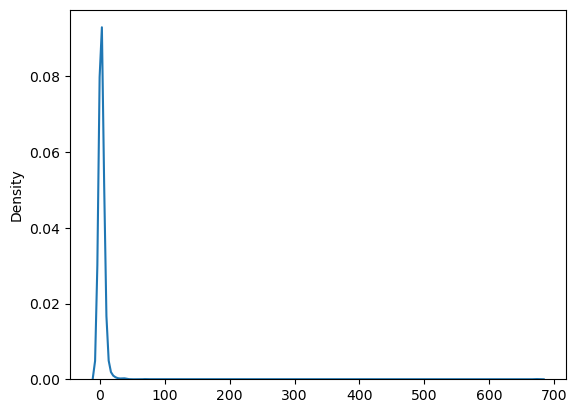

In [22]:
sns.kdeplot(fam_leng)

Meaning that there is some family that has plenty of associated proteins and then the majority have just a few. Bear in mind that here "in c term...." is also a family.... but many proteins will be of diferent kinds and have these attributes.

In [23]:
fam_contents

{'Belongs to the class I-like SAM-binding methyltransferase superfamily. C5-methyltransferase family': ['P05102',
  'P13864',
  'Q6Q386',
  'O88508',
  'P26358',
  'Q8EVR5',
  'Q9AXT8',
  'A0A2H1VE33',
  'Q76KU6',
  'Q9Y6K1'],
 'Belongs to the pancreatic ribonuclease family': ['P00669', 'P15468'],
 'Belongs to the GST superfamily. Pi family': ['P09211', 'P19157', 'P46427'],
 'Belongs to the ARTD/PARP family': ['P26446',
  'P09874',
  'Q9Y6F1',
  'Q460N3',
  'Q53GL7',
  'Q9H2K2',
  'Q460N5',
  'O95271',
  'Q6PFX9',
  'Q9UGN5'],
 'Belongs to the short-chain dehydrogenases/reductases (SDR) family': ['P14061',
  'P0AET8',
  'P10807',
  'P47227',
  'P08074',
  'P11348',
  'O70351',
  'Q01782',
  'Q93X62',
  'P80702',
  'Q12634',
  'P40288',
  'Q48436',
  'O93868',
  'P19992',
  'P09417',
  'P50163',
  'Q9LBG2',
  'P00334',
  'Q28960',
  'P9WGT1',
  'P42556',
  'P22414',
  'Q7Z4W1',
  'Q9W3H4',
  'Q99714',
  'Q7SIA1',
  'P16544',
  'P16152',
  'Q6UWP2',
  'Q6QLL4',
  'P28845',
  'P50172',
  

## Annotating the Chosen PDBs with their family.
Now we have a list of families on one hand and a list of PDBs for the other side. Let's merge it.

In [24]:
PDB_list = []
with open('ALL_chosen_pdbs.txt', 'r') as fin:
    for line in fin:
        PDB_list.append(line.strip())
fin.close()

In [25]:
PDB_maping_df

,UniProtID,PDB_codes,len,len_int
0,P05102,"[10mh, 1fjx, 1mht, 1skm, 2c7q, 2hmy, 2i9k, 2uy...",16,11-20
1,P00669,[11bg],1,1
2,P09211,"[12gs, 13gs, 17gs, 19gs, 1aqv, 1aqx, 1gss, 1pg...",22,21-99
3,P26446,"[1a26, 1efy, 1pax]",3,3
4,P14061,"[1a27, 1dht, 1equ, 1fds, 1fdt, 1fdu, 1fdw, 1i5...",17,11-20
...,...,...,...,...
5638,P23528,[5l6w],1,1
5639,Q8JJ25,"[5l8j, 5l8k, 5l8l]",3,3
5640,Q7YW97,[5lc1],1,1
5641,P21554,"[5tgz, 5xr8, 5xra]",3,3


In [26]:
type(PDB_maping_df['PDB_codes'][2])

list

In [27]:
pdb_families = {}
error_list = []
for pdb in PDB_list:
    a = PDB_maping_df['UniProtID'].loc[PDB_maping_df['PDB_codes'].str.contains(pdb.lower(), regex=False)].to_list()
    if a[0] in family_uniprot_df.index:
        pdb_families[pdb] = family_uniprot_df.loc[a[0]]
    else:
        error_list.append(pdb)



In [28]:
len(error_list)

331

In [29]:
len(pdb_families)

4490

There are some proteins that do not have an anotated family... We will ignore them and consider part of a "unknown family".

In [30]:
pdb_families_df = pd.concat([pd.DataFrame.from_dict(pdb_families).transpose() ,
                              pd.DataFrame( list(zip(['Unknown']*len(error_list), 
                                                     ['None']*len(error_list), 
                                                     ['None']*len(error_list),
                                                     ['None']*len(error_list), 
                                                     ['None']*len(error_list))), 
                                            index=error_list)],
                              axis=0)


In [31]:
pdb_families_df

,0,1,2,3,4
1a26,Belongs to the ARTD/PARP family,None,None,None,None
1a4i,In the N-terminal section; belongs to the tetr...,In the C-terminal section; belongs to the form...,None,None,None
1a4l,Belongs to the metallo-dependent hydrolases su...,None,None,None,None
1a4z,Belongs to the aldehyde dehydrogenase family,None,None,None,None
1a59,Belongs to the citrate synthase family,None,None,None,None
...,...,...,...,...,...
5fit,Unknown,None,None,None,None
5fkn,Unknown,None,None,None,None
5fv0,Unknown,None,None,None,None
5ief,Unknown,None,None,None,None


In [161]:
pdb_families_df.to_csv("pdb_families.csv", header=False, index=True)

In [32]:
unique_fams

array(['Belongs to the class I-like SAM-binding methyltransferase superfamily. C5-methyltransferase family',
       'Belongs to the pancreatic ribonuclease family',
       'Belongs to the GST superfamily. Pi family', ...,
       'In the C-terminal section; belongs to the DHPS family',
       'In the 4th section; belongs to the type-I 3-dehydroquinase family',
       'In the C-terminal section; belongs to the shikimate dehydrogenase family'],
      dtype=object)

## Dividing in training_testing and validation set

Order families by size.
Take the 1-2 protein families and 20% of the proteins there

And on the other hand take the rest.



In [55]:
families_l_df = pd.DataFrame(zip(list(fam_contents.keys()), fam_leng))

families_l_df.sort_values(by=[1], inplace=True, ascending=False)

In [56]:
families_l_df

,0,1
80,NaN,673
4,Belongs to the short-chain dehydrogenases/redu...,85
186,Belongs to the cytochrome P450 family,71
102,Belongs to the acyl-CoA dehydrogenase family,39
21,Belongs to the glyceraldehyde-3-phosphate dehy...,37
...,...,...
979,Belongs to the methyltransferase superfamily. ...,1
980,Belongs to the PBP/GOBP family,1
981,Belongs to the actin family. ARP2 subfamily,1
1765,In the C-terminal section; belongs to the shik...,1


Taking families with 1-2 members

In [61]:
subset_small_fams = families_l_df.loc[families_l_df[1] <= 2]

In [63]:
subset_small_fams

,0,1
1035,Belongs to the integrin beta chain family,2
735,Belongs to the ribosome-inactivating protein f...,2
1050,Belongs to the glycosyltransferase 29 family,2
1153,Belongs to the methyltransferase TylM1/DesVI f...,2
1037,Belongs to the clostridial glucosylating toxin...,2
...,...,...
979,Belongs to the methyltransferase superfamily. ...,1
980,Belongs to the PBP/GOBP family,1
981,Belongs to the actin family. ARP2 subfamily,1
1765,In the C-terminal section; belongs to the shik...,1


In [67]:
total_pdbs_subset = subset_small_fams[1].sum()
print(total_pdbs_subset)
print(total_pdbs_subset*0.2)

1603
320.6


So, if we want the 20% this is around 320 proteins.
I need to get list of proteins with these families and then take 320.

In [84]:
subset_small_fams.drop(labels=1722, inplace=True)

/tmp/ipykernel_12253/367923626.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset_small_fams.drop(labels=1722, inplace=True)


In [86]:
subset_small_fams

,0,1
1035,Belongs to the integrin beta chain family,2
735,Belongs to the ribosome-inactivating protein f...,2
1050,Belongs to the glycosyltransferase 29 family,2
1153,Belongs to the methyltransferase TylM1/DesVI f...,2
1037,Belongs to the clostridial glucosylating toxin...,2
...,...,...
977,Belongs to the Aux/IAA family,1
979,Belongs to the methyltransferase superfamily. ...,1
980,Belongs to the PBP/GOBP family,1
981,Belongs to the actin family. ARP2 subfamily,1


In [87]:
a = pdb_families_df[pdb_families_df[0].isin(subset_small_fams[0])]
b = pdb_families_df[pdb_families_df[1].isin(subset_small_fams[0])]
c = pdb_families_df[pdb_families_df[2].isin(subset_small_fams[0])]
d = pdb_families_df[pdb_families_df[3].isin(subset_small_fams[0])]
e = pdb_families_df[pdb_families_df[4].isin(subset_small_fams[0])]

In [95]:
len(a)

1273

In [98]:
small_fams_pdbs = pd.concat([a,b,c,d,e])

In [99]:
small_fams_pdbs

,0,1,2,3,4
1a4i,In the N-terminal section; belongs to the tetr...,In the C-terminal section; belongs to the form...,None,None,None
1ae1,Belongs to the short-chain dehydrogenases/redu...,None,None,None,None
1af0,Belongs to the peptidase M10B family,None,None,None,None
1agn,Belongs to the zinc-containing alcohol dehydro...,None,None,None,None
1am4,Belongs to the small GTPase superfamily. Rho f...,None,None,None,None
...,...,...,...,...,...
1nve,In the N-terminal section; belongs to the suga...,In the 2nd section; belongs to the EPSP syntha...,In the 3rd section; belongs to the shikimate k...,In the 4th section; belongs to the type-I 3-de...,In the C-terminal section; belongs to the shik...
1rbq,In the N-terminal section; belongs to the GARS...,In the central section; belongs to the AIR syn...,In the C-terminal section; belongs to the GART...,None,None
2bmb,In the N-terminal section; belongs to the DHNA...,In the central section; belongs to the HPPK fa...,In the C-terminal section; belongs to the DHPS...,None,None
1nve,In the N-terminal section; belongs to the suga...,In the 2nd section; belongs to the EPSP syntha...,In the 3rd section; belongs to the shikimate k...,In the 4th section; belongs to the type-I 3-de...,In the C-terminal section; belongs to the shik...


In [103]:
len(small_fams_pdbs)*0.2

262.8

In [105]:
validation_df = small_fams_pdbs.sample(n=263)

In [106]:
validation_df

,0,1,2,3,4
2xvm,Belongs to the TehB family,None,None,None,None
1hak,Belongs to the annexin family,None,None,None,None
2xtz,Belongs to the G-alpha family,None,None,None,None
4hne,Belongs to the PI3/PI4-kinase family. Type II ...,None,None,None,None
5c1d,Belongs to the glycosyltransferase 41 family. ...,None,None,None,None
...,...,...,...,...,...
4b48,Belongs to the TRAFAC class translation factor...,None,None,None,None
3lbe,Belongs to the thioester dehydratase family. F...,Belongs to the thioesterase PaaI family,None,None,None
3sgt,Belongs to the UPP synthase family,None,None,None,None
4fpy,Belongs to the glycosyl hydrolase 33 family,None,None,None,None


In [109]:
with open('validation_subset.txt', 'w') as wout:
    for i in list(validation_df.index):
        wout.write(i+'\n')
wout.close()

Now we have the list of pdbs to use for validation and we will create the list with the rest taking away these.

In [113]:
len(pdb_families_df)

4821

In [116]:
training_testing_df = pdb_families_df[ ~ pdb_families_df.index.isin(validation_df.index)]

In [117]:
len(training_testing_df)

4563

In [127]:
with open('training_testing_subset.txt', 'w') as wout:
    for i in list(training_testing_df.index):
        wout.write(i+'\n')
wout.close()

## Old work

In [33]:
fam_contents

{'Belongs to the class I-like SAM-binding methyltransferase superfamily. C5-methyltransferase family': ['P05102',
  'P13864',
  'Q6Q386',
  'O88508',
  'P26358',
  'Q8EVR5',
  'Q9AXT8',
  'A0A2H1VE33',
  'Q76KU6',
  'Q9Y6K1'],
 'Belongs to the pancreatic ribonuclease family': ['P00669', 'P15468'],
 'Belongs to the GST superfamily. Pi family': ['P09211', 'P19157', 'P46427'],
 'Belongs to the ARTD/PARP family': ['P26446',
  'P09874',
  'Q9Y6F1',
  'Q460N3',
  'Q53GL7',
  'Q9H2K2',
  'Q460N5',
  'O95271',
  'Q6PFX9',
  'Q9UGN5'],
 'Belongs to the short-chain dehydrogenases/reductases (SDR) family': ['P14061',
  'P0AET8',
  'P10807',
  'P47227',
  'P08074',
  'P11348',
  'O70351',
  'Q01782',
  'Q93X62',
  'P80702',
  'Q12634',
  'P40288',
  'Q48436',
  'O93868',
  'P19992',
  'P09417',
  'P50163',
  'Q9LBG2',
  'P00334',
  'Q28960',
  'P9WGT1',
  'P42556',
  'P22414',
  'Q7Z4W1',
  'Q9W3H4',
  'Q99714',
  'Q7SIA1',
  'P16544',
  'P16152',
  'Q6UWP2',
  'Q6QLL4',
  'P28845',
  'P50172',
  

Try to generate 4 groups from here

In [194]:
def get_chunks(lst, n):
    for i in range(0, len(lst), int(len(lst)/n)):
        yield lst[i:i +int(len(lst)/n)]


In [195]:
families_groups = list(get_chunks(unique_fams, 4))
families_groups_len = list(get_chunks(fam_leng, 4))

In [196]:
for i in families_groups_len:
    print(sum(i))

2910
1076
734
534
2


In [197]:
len(families_groups[0])

441

Now just slice the list of proteins by these groups...


In [199]:
pdb_families_df.loc[pdb_families.str.contains(families_groups[0][1])]

AttributeError: 'dict' object has no attribute 'str'

In [183]:
for i in range(0, len(fam_leng), int(len(fam_leng)/4)):
    print(i)

0
441
882
1323
1764


In [129]:
family_uniprot_df.loc['P05102']

0    Belongs to the class I-like SAM-binding methyl...
1                                                 None
2                                                 None
3                                                 None
4                                                 None
Name: P05102, dtype: object